In [1]:

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn import preprocessing
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import SGDRegressor
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import PolynomialFeatures

In [3]:
from sklearn.model_selection import cross_validate

In [4]:
df = pd.read_csv("rideshare.csv")
df = df.drop("id",axis = 1)

In [5]:
df = df.drop("datetime",axis = 1)

# Summarize the data

In [6]:
df.head()

,timestamp,hour,day,month,timezone,source,destination,cab_type,product_id,name,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,1.544953e+09,9,16,12,America/New_York,Haymarket Square,North Station,Lyft,lyft_line,Shared,...,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,1.543284e+09,2,27,11,America/New_York,Haymarket Square,North Station,Lyft,lyft_premier,Lux,...,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,1.543367e+09,1,28,11,America/New_York,Haymarket Square,North Station,Lyft,lyft,Lyft,...,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,1.543554e+09,4,30,11,America/New_York,Haymarket Square,North Station,Lyft,lyft_luxsuv,Lux Black XL,...,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,1.543463e+09,3,29,11,America/New_York,Haymarket Square,North Station,Lyft,lyft_plus,Lyft XL,...,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800


In [7]:
df.head().T

,0,1,2,3,4
timestamp,1544952608.0,1543284024.0,1543366822.0,1543553583.0,1543463360.0
hour,9,2,1,4,3
day,16,27,28,30,29
month,12,11,11,11,11
timezone,America/New_York,America/New_York,America/New_York,America/New_York,America/New_York
source,Haymarket Square,Haymarket Square,Haymarket Square,Haymarket Square,Haymarket Square
destination,North Station,North Station,North Station,North Station,North Station
cab_type,Lyft,Lyft,Lyft,Lyft,Lyft
product_id,lyft_line,lyft_premier,lyft,lyft_luxsuv,lyft_plus
name,Shared,Lux,Lyft,Lux Black XL,Lyft XL


In [8]:
df.describe()

,timestamp,hour,day,month,price,distance,surge_multiplier,latitude,longitude,temperature,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
count,6.930700e+05,693070.000000,693070.000000,693070.000000,637975.000000,693070.000000,693070.000000,693070.000000,693070.000000,693070.000000,...,693070.000000,6.930700e+05,693070.000000,6.930700e+05,693070.000000,6.930700e+05,693070.000000,6.930700e+05,693070.000000,6.930700e+05
mean,1.544049e+09,11.619154,17.794384,11.586684,16.545108,2.189428,1.013870,42.338172,-71.066151,39.584379,...,0.037374,1.544044e+09,33.457761,1.544042e+09,45.261295,1.544047e+09,29.730987,1.544048e+09,41.997321,1.544048e+09
std,7.056574e+05,6.948105,9.982279,0.492429,9.324356,1.138937,0.091641,0.047840,0.020302,6.726084,...,0.055214,6.912032e+05,6.467219,6.901959e+05,5.645031,6.901358e+05,7.110489,6.871867e+05,6.936823,6.910781e+05
min,1.543204e+09,0.000000,1.000000,11.000000,2.500000,0.020000,1.000000,42.214800,-71.105400,18.910000,...,0.000000,1.543162e+09,15.630000,1.543122e+09,33.510000,1.543154e+09,11.810000,1.543136e+09,28.950000,1.543187e+09
25%,1.543444e+09,6.000000,13.000000,11.000000,9.000000,1.280000,1.000000,42.350300,-71.081000,36.450000,...,0.000000,1.543421e+09,30.170000,1.543399e+09,42.570000,1.543439e+09,27.760000,1.543399e+09,36.570000,1.543439e+09
50%,1.543737e+09,12.000000,17.000000,12.000000,13.500000,2.160000,1.000000,42.351900,-71.063100,40.490000,...,0.000400,1.543770e+09,34.240000,1.543727e+09,44.680000,1.543788e+09,30.130000,1.543745e+09,40.950000,1.543788e+09
75%,1.544828e+09,18.000000,28.000000,12.000000,22.500000,2.920000,1.000000,42.364700,-71.054200,43.580000,...,0.091600,1.544807e+09,38.880000,1.544789e+09,46.910000,1.544814e+09,35.710000,1.544789e+09,44.120000,1.544818e+09
max,1.550000e+09,23.000000,30.000000,12.000000,97.500000,7.860000,3.000000,42.366100,-71.033000,57.220000,...,0.145900,1.545152e+09,43.100000,1.545192e+09,57.870000,1.545109e+09,40.050000,1.545134e+09,57.200000,1.545109e+09


# How much data is present

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 693070 entries, 0 to 693069
Data columns (total 55 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   timestamp                    693070 non-null  float64
 1   hour                         693070 non-null  int64  
 2   day                          693070 non-null  int64  
 3   month                        693070 non-null  int64  
 4   timezone                     693070 non-null  object 
 5   source                       693070 non-null  object 
 6   destination                  693070 non-null  object 
 7   cab_type                     693070 non-null  object 
 8   product_id                   693070 non-null  object 
 9   name                         693070 non-null  object 
 10  price                        637975 non-null  float64
 11  distance                     693070 non-null  float64
 12  surge_multiplier             693070 non-null  float64
 13 

In [10]:
df.shape

(693070, 55)

In [11]:
df.isnull().sum()

timestamp                          0
hour                               0
day                                0
month                              0
timezone                           0
source                             0
destination                        0
cab_type                           0
product_id                         0
name                               0
price                          55095
distance                           0
surge_multiplier                   0
latitude                           0
longitude                          0
temperature                        0
apparentTemperature                0
short_summary                      0
long_summary                       0
precipIntensity                    0
precipProbability                  0
humidity                           0
windSpeed                          0
windGust                           0
windGustTime                       0
visibility                         0
temperatureHigh                    0
t

#  What attributes/features are continuous valued? Which attributes are categorical? 

In [12]:
"""
Working with primary assumption that features with less than 50 values could be categorical 
""" 
for f in df.columns:
    unique_values = df[f].nunique()
#     if(unique_values < 50):
    print(f,unique_values)

timestamp 31196
hour 24
day 17
month 2
timezone 1
source 12
destination 12
cab_type 2
product_id 13
name 13
price 147
distance 549
surge_multiplier 7
latitude 11
longitude 12
temperature 308
apparentTemperature 319
short_summary 9
long_summary 11
precipIntensity 63
precipProbability 29
humidity 51
windSpeed 291
windGust 286
windGustTime 25
visibility 227
temperatureHigh 129
temperatureHighTime 23
temperatureLow 133
temperatureLowTime 31
apparentTemperatureHigh 124
apparentTemperatureHighTime 27
apparentTemperatureLow 136
apparentTemperatureLowTime 32
icon 7
dewPoint 313
pressure 316
windBearing 195
cloudCover 83
uvIndex 3
visibility.1 227
ozone 274
sunriseTime 110
sunsetTime 114
moonPhase 18
precipIntensityMax 65
uvIndexTime 20
temperatureMin 131
temperatureMinTime 25
temperatureMax 128
temperatureMaxTime 23
apparentTemperatureMin 137
apparentTemperatureMinTime 29
apparentTemperatureMax 125
apparentTemperatureMaxTime 27


In [13]:
categorical_columns = ["surge_multiplier","hour","day","month","timezone","source","destination","cab_type","product_id","name","latitude","longitude","short_summary","long_summary","icon","uvIndex"]

In [14]:
continuous_columns = [column for column in df.columns if column not in categorical_columns]

In [15]:
print(categorical_columns)

['surge_multiplier', 'hour', 'day', 'month', 'timezone', 'source', 'destination', 'cab_type', 'product_id', 'name', 'latitude', 'longitude', 'short_summary', 'long_summary', 'icon', 'uvIndex']


In [16]:
print(continuous_columns)

['timestamp', 'price', 'distance', 'temperature', 'apparentTemperature', 'precipIntensity', 'precipProbability', 'humidity', 'windSpeed', 'windGust', 'windGustTime', 'visibility', 'temperatureHigh', 'temperatureHighTime', 'temperatureLow', 'temperatureLowTime', 'apparentTemperatureHigh', 'apparentTemperatureHighTime', 'apparentTemperatureLow', 'apparentTemperatureLowTime', 'dewPoint', 'pressure', 'windBearing', 'cloudCover', 'visibility.1', 'ozone', 'sunriseTime', 'sunsetTime', 'moonPhase', 'precipIntensityMax', 'uvIndexTime', 'temperatureMin', 'temperatureMinTime', 'temperatureMax', 'temperatureMaxTime', 'apparentTemperatureMin', 'apparentTemperatureMinTime', 'apparentTemperatureMax', 'apparentTemperatureMaxTime']


In [17]:
len(continuous_columns) + len(categorical_columns)

55

# Display  the  statistical  values  for  each  of  the  attributes,  along  with  visualizations  (e.g., histogram)  of  the  distributions  for  each  attribute.

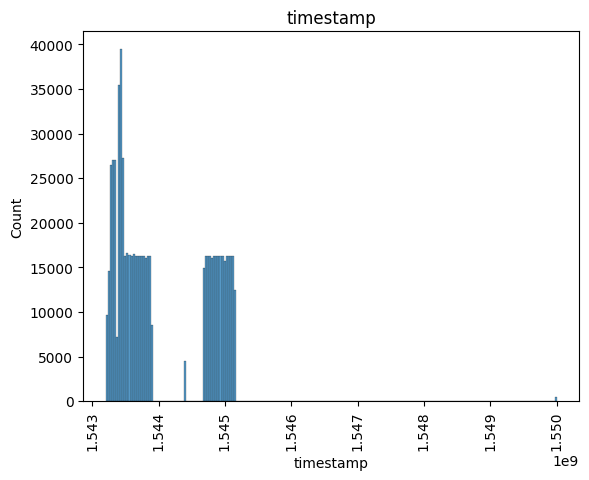

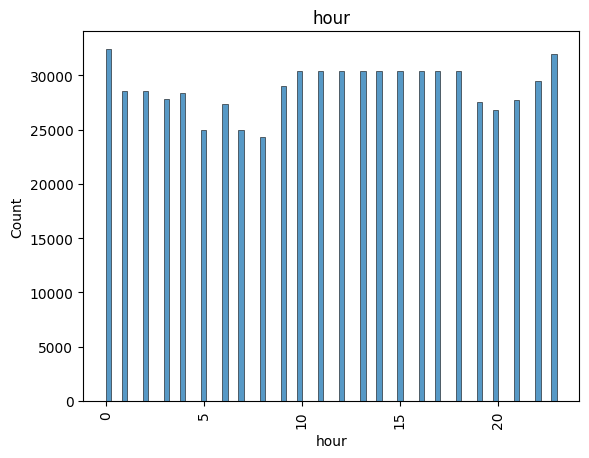

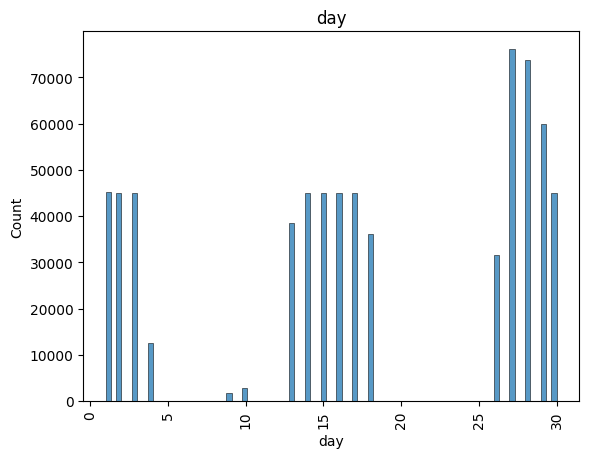

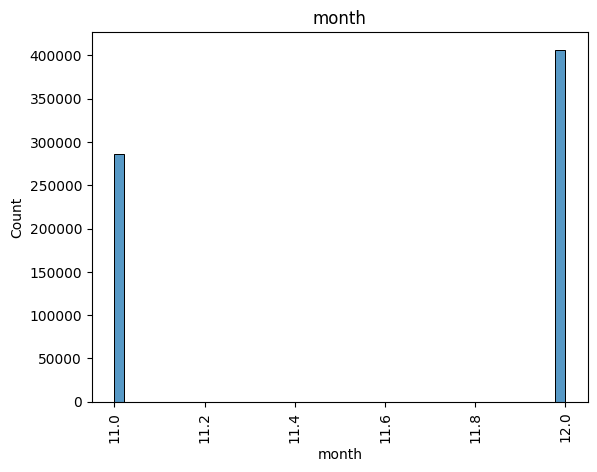

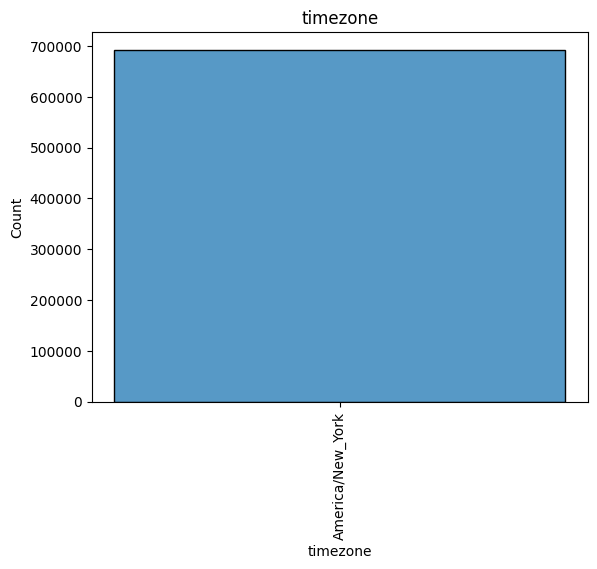

...

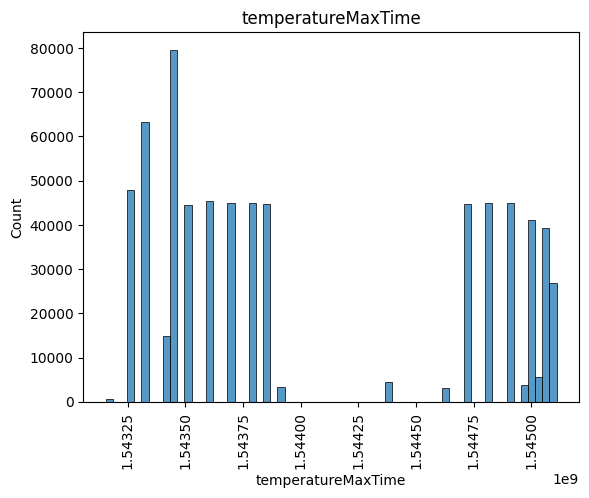

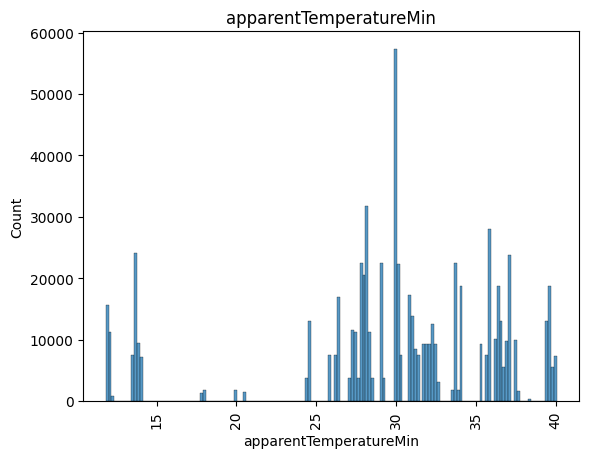

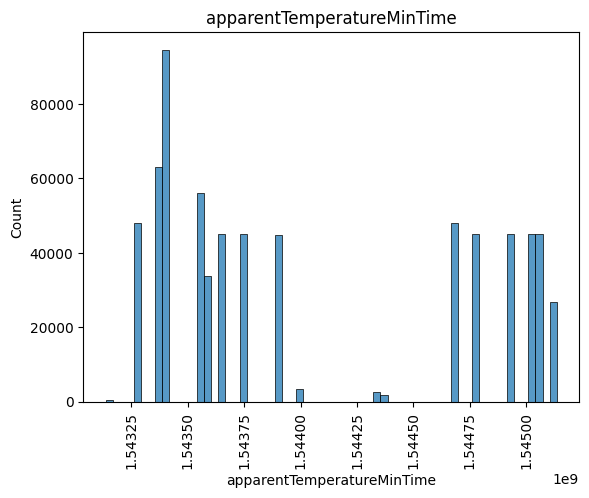

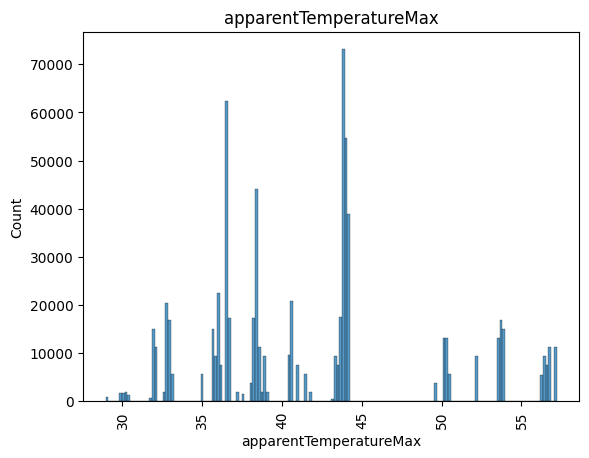

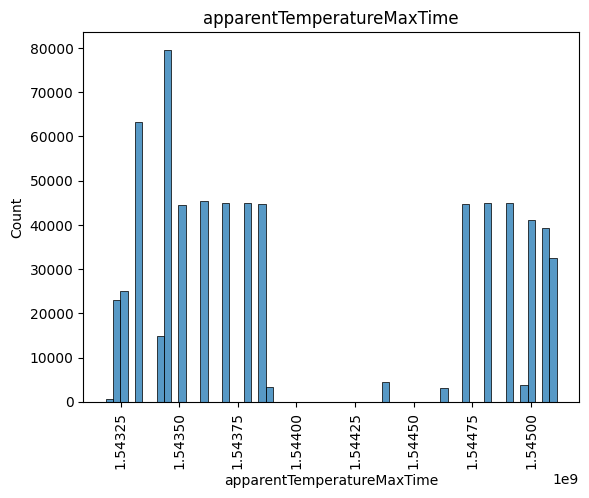

In [18]:
cols = []
def histogram(df):
    for col in df.columns:
        ax = sns.histplot(df,x = col,kde=False)
        plt.xticks(rotation=90)
        plt.title(col)
        plt.show()
        

histogram(df)

# Explain  noticeable  traits  for  key attributes. 

From the graphs its apparent that among the dataset all the sources and all the destinations are equally likely. 
We have more data for Uber than we have for Lyft. This observation follows through the data on cab names as well.
Most importantly, from an initial observation it is clear that distance and surge factors will have the most impact on the price. In terms of distance, most distances were within 5 miles and everything after that seems like outlier data and can be excluded. 

Temperature based data forms a normal distribution here. 

array([[<Axes: title={'center': 'timestamp'}>,
        <Axes: title={'center': 'hour'}>,
        <Axes: title={'center': 'day'}>,
        <Axes: title={'center': 'month'}>,
        <Axes: title={'center': 'price'}>,
        <Axes: title={'center': 'distance'}>,
        <Axes: title={'center': 'surge_multiplier'}>],
       [<Axes: title={'center': 'latitude'}>,
        <Axes: title={'center': 'longitude'}>,
        <Axes: title={'center': 'temperature'}>,
        <Axes: title={'center': 'apparentTemperature'}>,
        <Axes: title={'center': 'precipIntensity'}>,
        <Axes: title={'center': 'precipProbability'}>,
        <Axes: title={'center': 'humidity'}>],
       [<Axes: title={'center': 'windSpeed'}>,
        <Axes: title={'center': 'windGust'}>,
        <Axes: title={'center': 'windGustTime'}>,
        <Axes: title={'center': 'visibility'}>,
        <Axes: title={'center': 'temperatureHigh'}>,
        <Axes: title={'center': 'temperatureHighTime'}>,
        <Axes: title={'cente

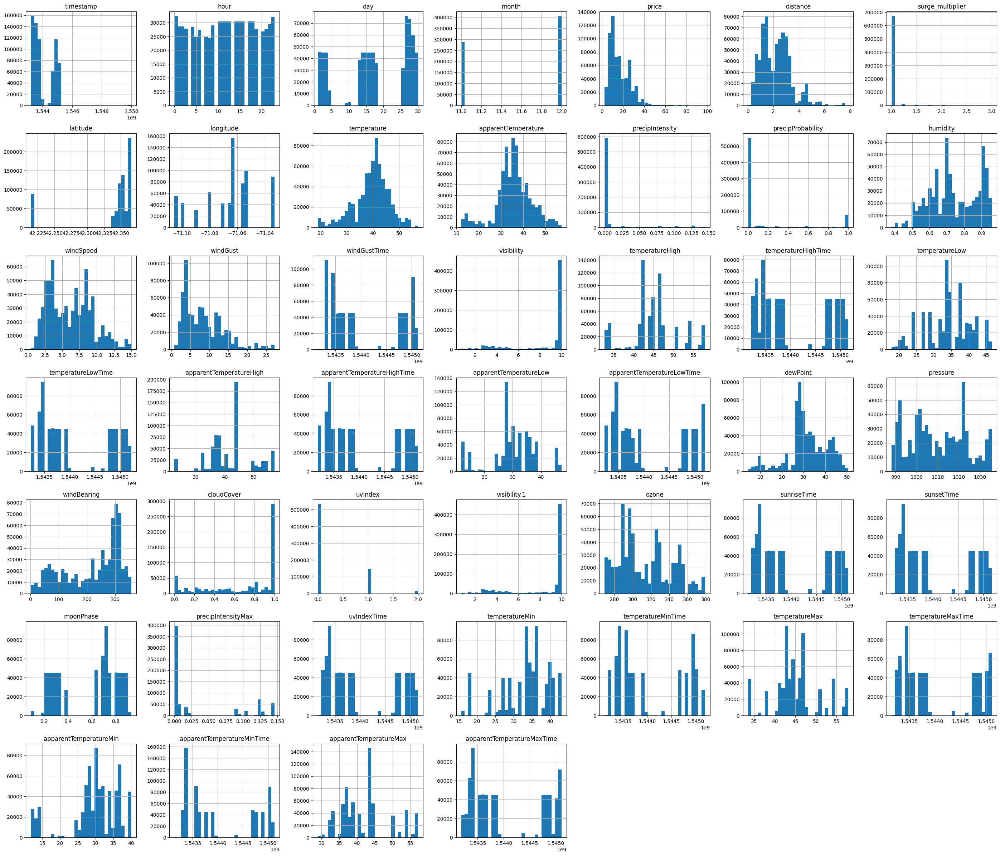

In [19]:
X = "price"
Y = list(df.columns)
df.hist(bins = 30, figsize = (35,30))

In [20]:
# We drop timezone since it is a single value
df.drop("timezone", axis = 1, inplace = True)

In [21]:
# We also drop timestamp because it provides no new info that isnt covered in hour day and month
df.drop("timestamp", axis = 1, inplace = True)

In [22]:
#Since both the visibilities contain the same values, we can drop one
df["visibility"].unique() == df["visibility.1"].unique()


array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

In [23]:
df.drop("visibility.1", axis = 1, inplace = True)

In [24]:
categorical_columns.remove("timezone")

In [25]:
df

,hour,day,month,source,destination,cab_type,product_id,name,price,distance,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,9,16,12,Haymarket Square,North Station,Lyft,lyft_line,Shared,5.0,0.44,...,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,2,27,11,Haymarket Square,North Station,Lyft,lyft_premier,Lux,11.0,0.44,...,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,1,28,11,Haymarket Square,North Station,Lyft,lyft,Lyft,7.0,0.44,...,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,4,30,11,Haymarket Square,North Station,Lyft,lyft_luxsuv,Lux Black XL,26.0,0.44,...,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,3,29,11,Haymarket Square,North Station,Lyft,lyft_plus,Lyft XL,9.0,0.44,...,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
693065,23,1,12,West End,North End,Uber,6f72dfc5-27f1-42e8-84db-ccc7a75f6969,UberXL,13.0,1.00,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800
693066,23,1,12,West End,North End,Uber,55c66225-fbe7-4fd5-9072-eab1ece5e23e,UberX,9.5,1.00,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800
693067,23,1,12,West End,North End,Uber,8cf7e821-f0d3-49c6-8eba-e679c0ebcf6a,Taxi,NaN,1.00,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800
693068,23,1,12,West End,North End,Uber,6d318bcc-22a3-4af6-bddd-b409bfce1546,Black SUV,27.0,1.00,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800


In [26]:
# Drop the NAN data
df.dropna(axis=0,inplace=True)

array([[<Axes: title={'center': 'hour'}>,
        <Axes: title={'center': 'day'}>,
        <Axes: title={'center': 'month'}>,
        <Axes: title={'center': 'price'}>,
        <Axes: title={'center': 'distance'}>,
        <Axes: title={'center': 'surge_multiplier'}>,
        <Axes: title={'center': 'latitude'}>],
       [<Axes: title={'center': 'longitude'}>,
        <Axes: title={'center': 'temperature'}>,
        <Axes: title={'center': 'apparentTemperature'}>,
        <Axes: title={'center': 'precipIntensity'}>,
        <Axes: title={'center': 'precipProbability'}>,
        <Axes: title={'center': 'humidity'}>,
        <Axes: title={'center': 'windSpeed'}>],
       [<Axes: title={'center': 'windGust'}>,
        <Axes: title={'center': 'windGustTime'}>,
        <Axes: title={'center': 'visibility'}>,
        <Axes: title={'center': 'temperatureHigh'}>,
        <Axes: title={'center': 'temperatureHighTime'}>,
        <Axes: title={'center': 'temperatureLow'}>,
        <Axes: title={'

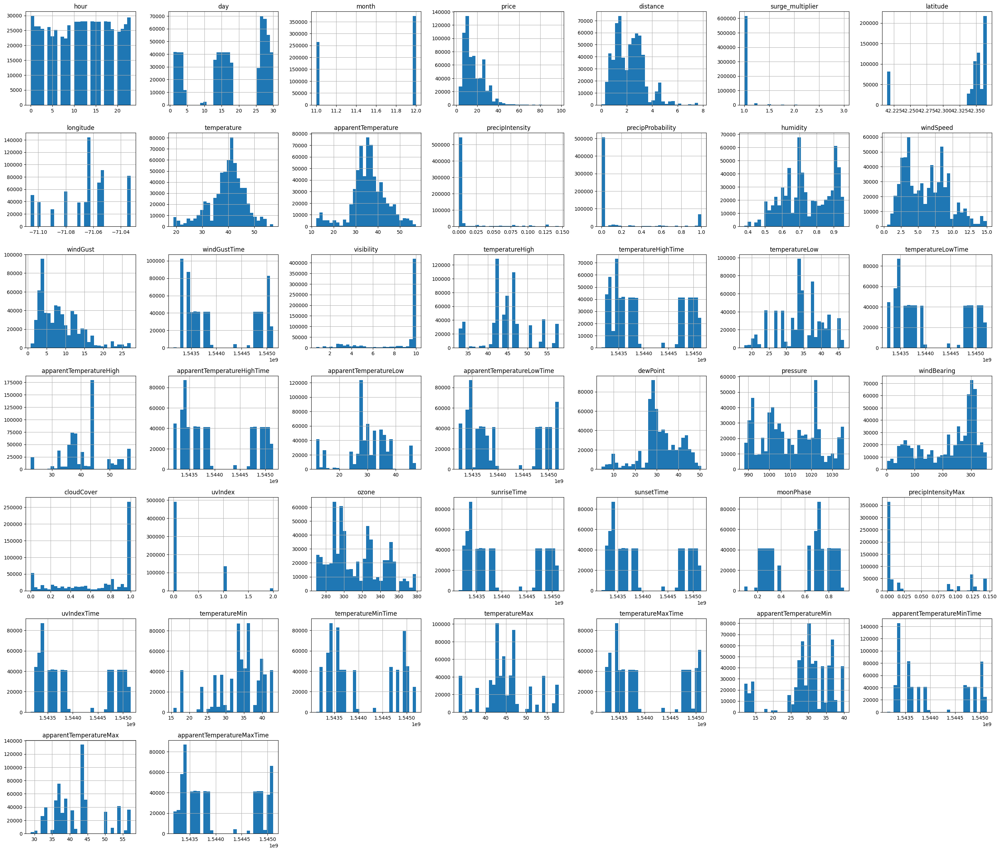

In [27]:
df.hist(bins=30, figsize=(35, 30))

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 637975 entries, 0 to 693069
Data columns (total 52 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   hour                         637975 non-null  int64  
 1   day                          637975 non-null  int64  
 2   month                        637975 non-null  int64  
 3   source                       637975 non-null  object 
 4   destination                  637975 non-null  object 
 5   cab_type                     637975 non-null  object 
 6   product_id                   637975 non-null  object 
 7   name                         637975 non-null  object 
 8   price                        637975 non-null  float64
 9   distance                     637975 non-null  float64
 10  surge_multiplier             637975 non-null  float64
 11  latitude                     637975 non-null  float64
 12  longitude                    637975 non-null  float64
 13 

# Are  there  any  attributes  that  might  require  special  treatment?  If  so,  what  special treatment might they require? 

Yes, the continuous varibles need to be normalised and the categorical variables need to converted to one hot encoding

Normalise the data

In [29]:
continuous_columns = [column for column in df.columns if column not in categorical_columns]

In [30]:
def z_score_normalizer(X):
    X_mean = np.mean(X)
    X_std = np.std(X)
    X_scaled = (X - X_mean) / X_std
    return X_scaled

In [31]:
for col in continuous_columns:
    df[col] = z_score_normalizer(df[col])

One hot encoding will increase the total number of features of the dataset, since we have many categorical variables, before conducting one hot encoding we will check the correlation to see if any features could be removed. 

<Axes: >

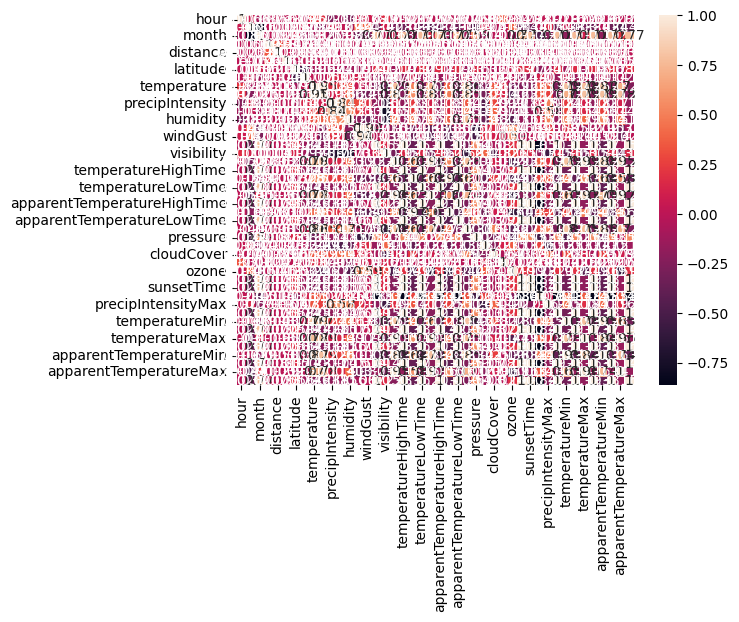

In [32]:
corr_matrix = df.corr()
sns.heatmap(corr_matrix, annot=True)

Since, we have a huge number of features, we could group them and run the correlation matrix

<Axes: >

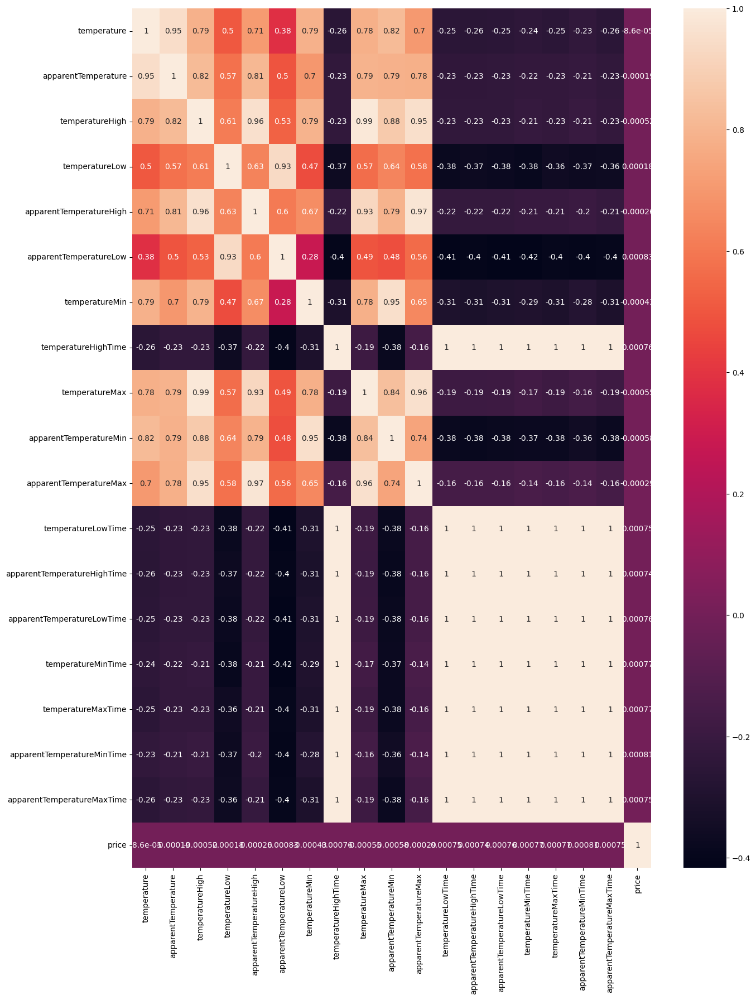

In [33]:
temperature_based = ['temperature','apparentTemperature','temperatureHigh','temperatureLow','apparentTemperatureHigh', 'apparentTemperatureLow','temperatureMin','temperatureHighTime','temperatureMax','apparentTemperatureMin','apparentTemperatureMax','temperatureLowTime','apparentTemperatureHighTime','apparentTemperatureLowTime','temperatureMinTime','temperatureMaxTime','apparentTemperatureMinTime','apparentTemperatureMaxTime','price']
climate_based = ['precipIntensity', 'precipProbability', 'humidity', 'windSpeed','windGust', 'visibility', 'dewPoint', 'pressure', 'windBearing','cloudCover', 'uvIndex', 'ozone', 'moonPhase','precipIntensityMax','sunriseTime','sunsetTime','uvIndexTime','windGustTime','price']

df_temp = df[temperature_based]
df_climate = df[climate_based]
temp_corr = df_temp.corr()
plt.figure(figsize=(15,20))
sns.heatmap(temp_corr,annot=True)

<Axes: >

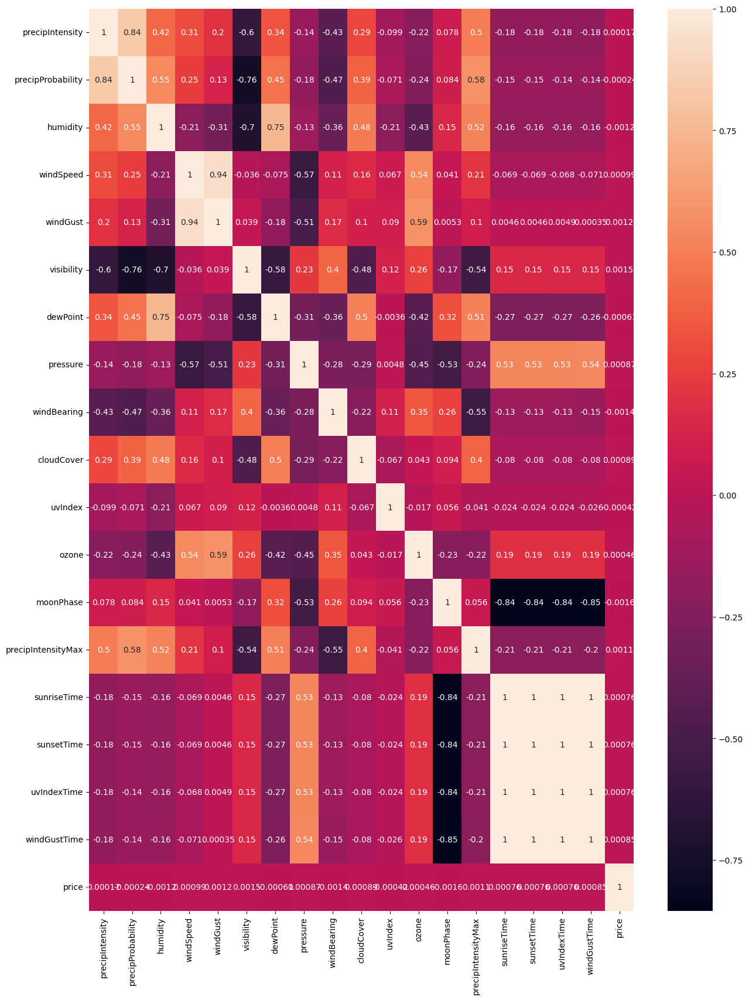

In [34]:
climate_corr = df_climate.corr()
plt.figure(figsize=(15,20))
sns.heatmap(climate_corr,annot=True)

We can see that neither the temperature features nor the climate features have a very correlation with the price. We can further prove this by taking the scatter plot of features with price.

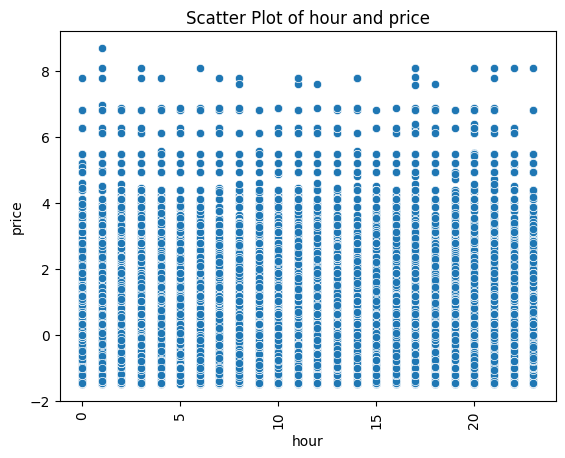

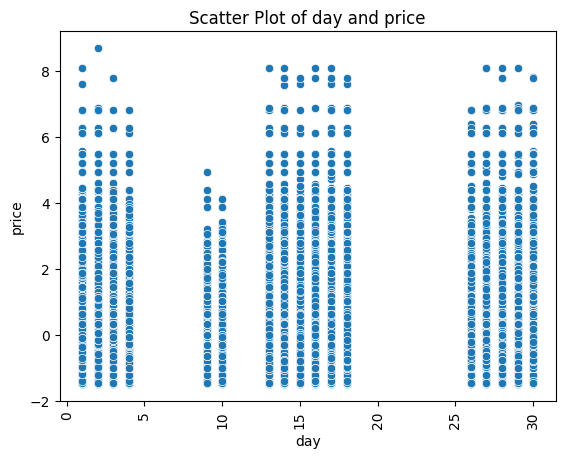

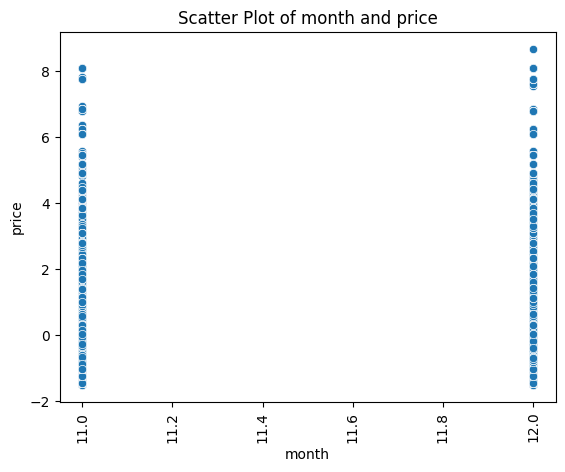

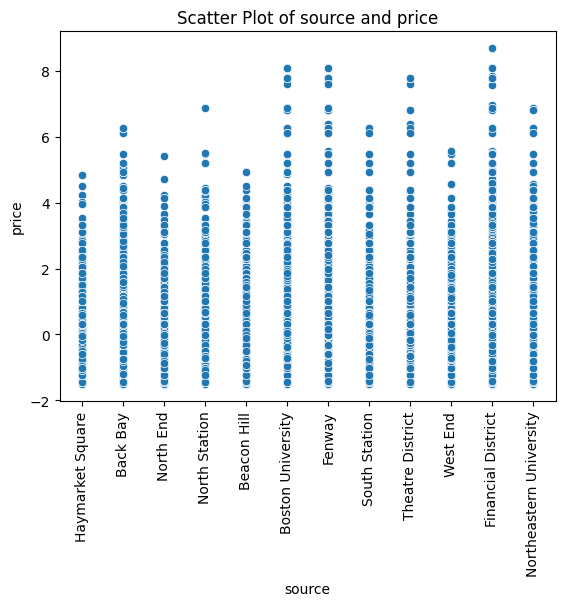

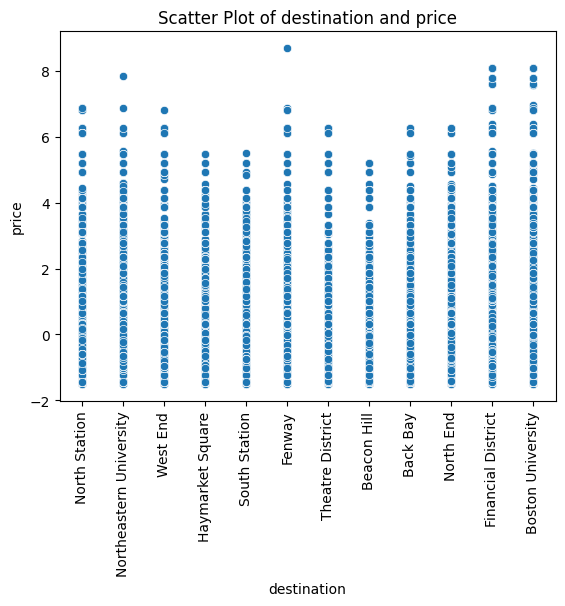

...

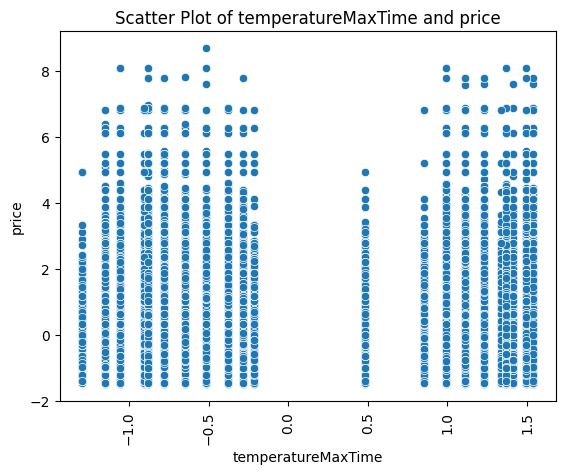

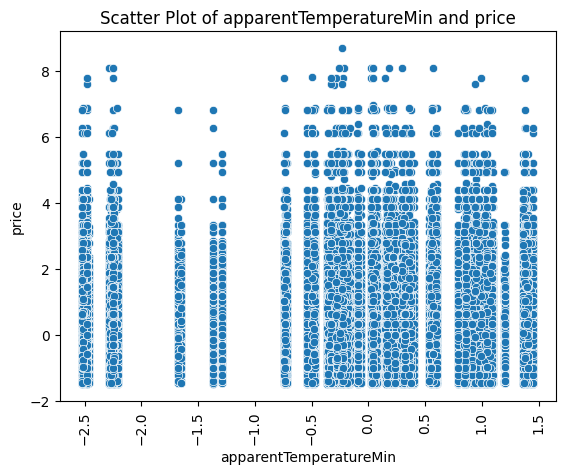

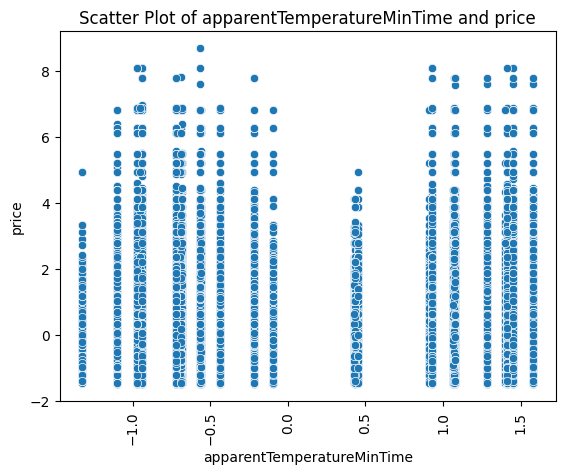

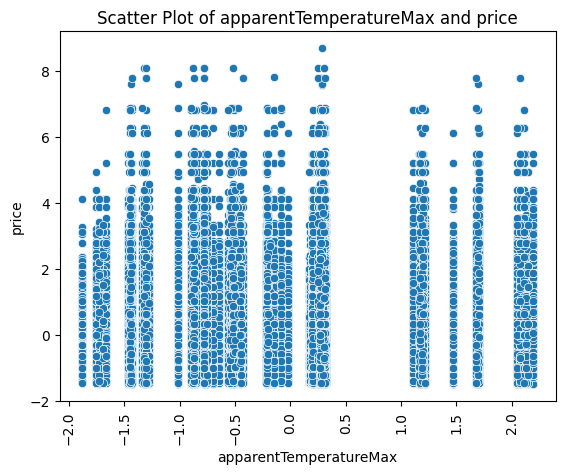

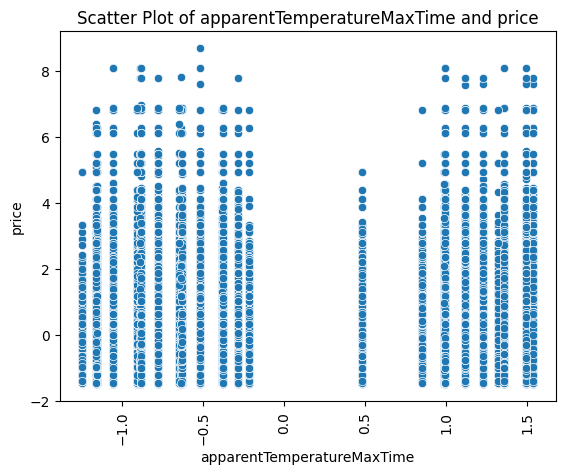

In [35]:

temp_corr_price = temp_corr["price"]
climate_corr_price = climate_corr["price"]
# Plot scatter plots for each attribute and the label
for col in df.columns:
    if col != "price":
        sns.scatterplot(x=df[col], y=df["price"])
        plt.xticks(rotation=90)
        plt.title("Scatter Plot of " + col + " and price")
        plt.show()

Hence we can drop all the temperature and climate based features

In [36]:
temperature_based.remove("price")
climate_based.remove("price")
df.drop(temperature_based, axis = 1, inplace=True)
df.drop(climate_based, axis=1, inplace=True)

We also drop product_id because it contains garbage values

In [37]:
df.drop("product_id", inplace = True, axis = 1)

In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 637975 entries, 0 to 693069
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   hour              637975 non-null  int64  
 1   day               637975 non-null  int64  
 2   month             637975 non-null  int64  
 3   source            637975 non-null  object 
 4   destination       637975 non-null  object 
 5   cab_type          637975 non-null  object 
 6   name              637975 non-null  object 
 7   price             637975 non-null  float64
 8   distance          637975 non-null  float64
 9   surge_multiplier  637975 non-null  float64
 10  latitude          637975 non-null  float64
 11  longitude         637975 non-null  float64
 12  short_summary     637975 non-null  object 
 13  long_summary      637975 non-null  object 
 14  icon              637975 non-null  object 
dtypes: float64(5), int64(3), object(7)
memory usage: 77.9+ MB


In [39]:
df_hours = pd.get_dummies(df['hour'],columns=['hour'],drop_first=True)

In [40]:
df_hours['price'] = df['price']

In [41]:
df_hours

,1,2,3,4,5,6,7,8,9,10,...,15,16,17,18,19,20,21,22,23,price
0,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,-1.238168
1,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-0.594691
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-1.023676
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1.014000
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-0.809183
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
693064,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,-0.755560
693065,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,-0.380199
693066,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,-0.755560
693068,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1.121246


<Axes: >

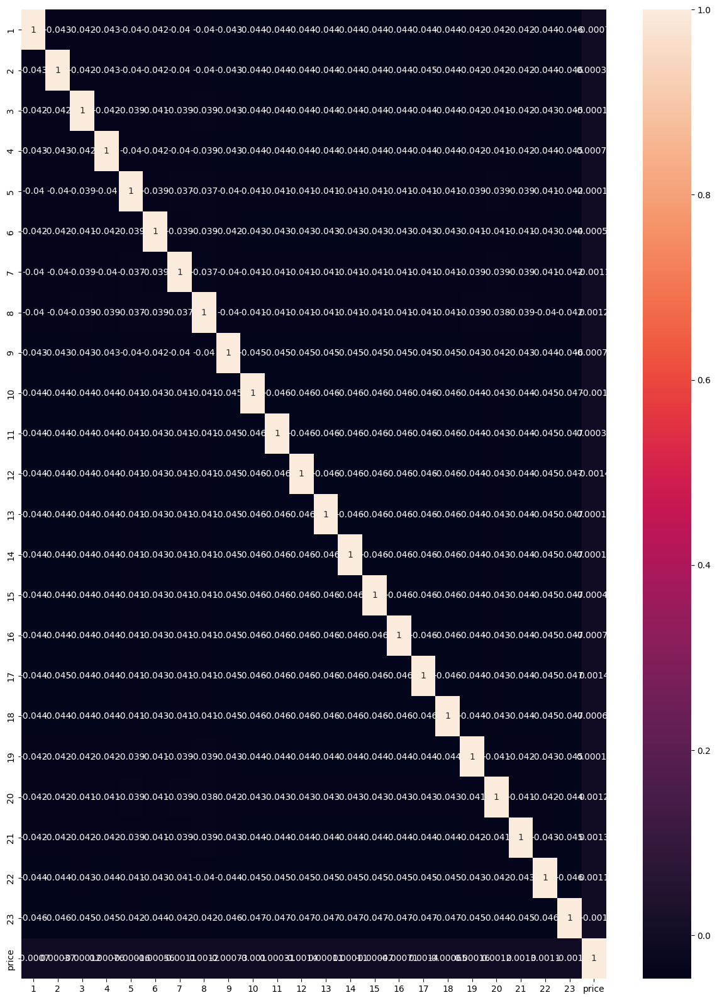

In [42]:
hours_corr = df_hours.corr()
plt.figure(figsize=(15,20))
sns.heatmap(hours_corr,annot=True)

There isnt much correlation between hours and the final price. 

Similarly, there is no correlation between days and month to the final price as well, so we can drop them

In [43]:
df.drop("hour", axis = 1, inplace = True)
df.drop("day", axis = 1, inplace = True)
df.drop("month", axis = 1, inplace = True)

categorical_columns.remove("hour")
categorical_columns.remove("day")
categorical_columns.remove("month")

In [44]:
df.drop("latitude", axis = 1, inplace = True)
df.drop("longitude", axis = 1, inplace = True)
df.drop("long_summary", axis = 1, inplace = True)

In [45]:
for x in ["product_id","uvIndex","long_summary","latitude","longitude"]:
    categorical_columns.remove(x)

In [46]:
df.icon.unique()

array([' partly-cloudy-night ', ' rain ', ' clear-night ', ' cloudy ',
       ' fog ', ' clear-day ', ' partly-cloudy-day '], dtype=object)

In [47]:
df.short_summary.unique()

array([' Mostly Cloudy ', ' Rain ', ' Clear ', ' Partly Cloudy ',
       ' Overcast ', ' Light Rain ', ' Foggy ', ' Possible Drizzle ',
       ' Drizzle '], dtype=object)

Icon and short_summary consist of mainly the same information so icon can also be removed

In [48]:
df.drop("icon", axis = 1, inplace = True)
categorical_columns.remove("icon")

In [49]:
df

,source,destination,cab_type,name,price,distance,surge_multiplier,short_summary
0,Haymarket Square,North Station,Lyft,Shared,-1.238168,-1.540638,1.0,Mostly Cloudy
1,Haymarket Square,North Station,Lyft,Lux,-0.594691,-1.540638,1.0,Rain
2,Haymarket Square,North Station,Lyft,Lyft,-1.023676,-1.540638,1.0,Clear
3,Haymarket Square,North Station,Lyft,Lux Black XL,1.014000,-1.540638,1.0,Clear
4,Haymarket Square,North Station,Lyft,Lyft XL,-0.809183,-1.540638,1.0,Partly Cloudy
...,...,...,...,...,...,...,...,...
693064,West End,North End,Uber,WAV,-0.755560,-1.047425,1.0,Partly Cloudy
693065,West End,North End,Uber,UberXL,-0.380199,-1.047425,1.0,Partly Cloudy
693066,West End,North End,Uber,UberX,-0.755560,-1.047425,1.0,Partly Cloudy
693068,West End,North End,Uber,Black SUV,1.121246,-1.047425,1.0,Partly Cloudy


<Axes: >

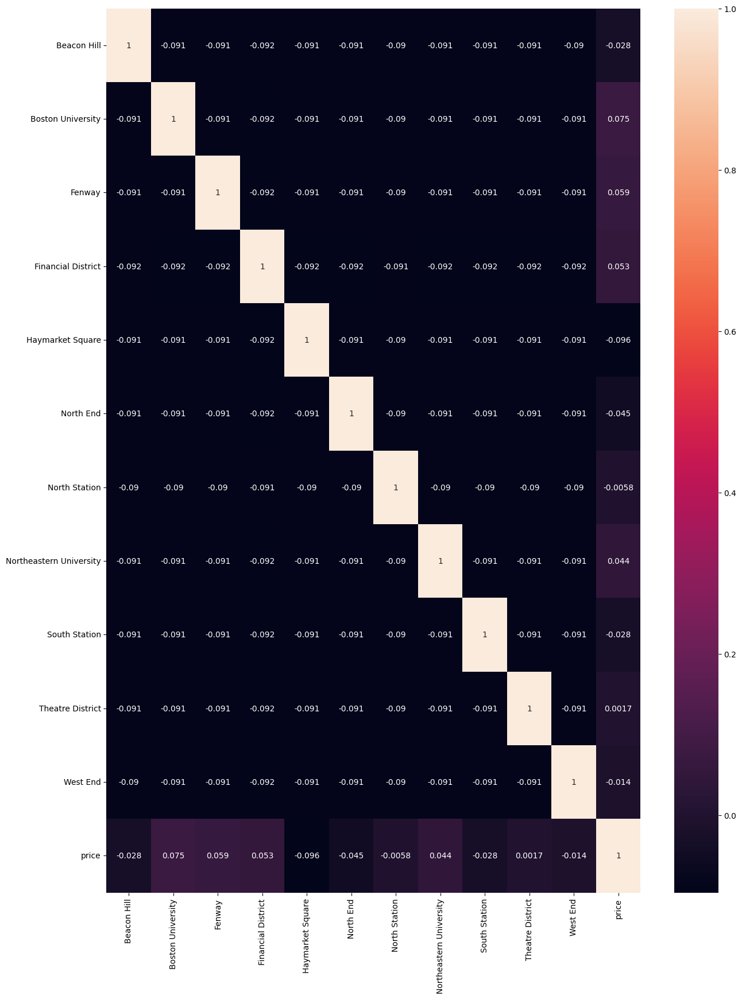

In [50]:
df_source = pd.get_dummies(df['source'],columns=['source'],drop_first=True)
df_source["price"] = df["price"]
source_corr = df_source.corr()
plt.figure(figsize=(15,20))
sns.heatmap(source_corr,annot=True)

So source and target can be removed as well

In [51]:
df.drop("source", axis = 1, inplace = True)
categorical_columns.remove("source")
df.drop("destination", axis = 1, inplace = True)
categorical_columns.remove("destination")

In [52]:
df.head()

,cab_type,name,price,distance,surge_multiplier,short_summary
0,Lyft,Shared,-1.238168,-1.540638,1.0,Mostly Cloudy
1,Lyft,Lux,-0.594691,-1.540638,1.0,Rain
2,Lyft,Lyft,-1.023676,-1.540638,1.0,Clear
3,Lyft,Lux Black XL,1.014000,-1.540638,1.0,Clear
4,Lyft,Lyft XL,-0.809183,-1.540638,1.0,Partly Cloudy


In [53]:
df.isnull().sum()

cab_type            0
name                0
price               0
distance            0
surge_multiplier    0
short_summary       0
dtype: int64

So cab_type, name, distance, surge_multiplier and short_summary are our final features in the dataset

Distance and surge multiplier are the only continuous variables here

The remaining are all categorical

In [54]:
categorical_columns

['surge_multiplier', 'cab_type', 'name', 'short_summary']

we need to one-hot encode all the categorical values

In [55]:
from sklearn.preprocessing import OneHotEncoder

for col in categorical_columns:
    encoder = OneHotEncoder(handle_unknown='ignore')
    enc_df = pd.DataFrame(encoder.fit_transform(df[[col]]).toarray())
    enc_df.columns = encoder.get_feature_names_out([col])
    df = df.drop(col, axis=1)
    df = pd.concat([df, enc_df], axis=1)

In [56]:
df.dropna(axis=0,inplace=True)

In [57]:
df.shape

(587332, 35)

In [58]:
df.isnull().sum()

price                               0
distance                            0
surge_multiplier_1.0                0
surge_multiplier_1.25               0
surge_multiplier_1.5                0
surge_multiplier_1.75               0
surge_multiplier_2.0                0
surge_multiplier_2.5                0
surge_multiplier_3.0                0
cab_type_Lyft                       0
cab_type_Uber                       0
cab_type_nan                        0
name_Black                          0
name_Black SUV                      0
name_Lux                            0
name_Lux Black                      0
name_Lux Black XL                   0
name_Lyft                           0
name_Lyft XL                        0
name_Shared                         0
name_UberPool                       0
name_UberX                          0
name_UberXL                         0
name_WAV                            0
name_nan                            0
short_summary_ Clear                0
short_summar

In [59]:
#split the data

In [60]:
from scipy.stats import pearsonr

prsnr=[]
for all in df.columns:
    if all != 'price':
        corr, _ = pearsonr(df[all], df['price'])
        prsnr.append((all,corr))

prsnr

[('distance', 0.34509796193788167),
 ('surge_multiplier_1.0', 0.002045069802647982),
 ('surge_multiplier_1.25', -0.00100625021963794),
 ('surge_multiplier_1.5', -0.0006402177261538061),
 ('surge_multiplier_1.75', -3.853704736170993e-05),
 ('surge_multiplier_2.0', -0.00223550779775382),
 ('surge_multiplier_2.5', -0.0023835027551506694),
 ('surge_multiplier_3.0', -0.0012585889143870246),
 ('cab_type_Lyft', -0.00041687239001284254),
 ('cab_type_Uber', 0.0004168723900128605),
 ('cab_type_nan', nan),
 ('name_Black', 0.0011145876168176581),
 ('name_Black SUV', -0.0003984249017790154),
 ('name_Lux', -8.999189767076247e-05),
 ('name_Lux Black', -0.0007030606347878111),
 ('name_Lux Black XL', 0.0014565082024606635),
 ('name_Lyft', -0.00013640147853074614),
 ('name_Lyft XL', 0.0002747237418476092),
 ('name_Shared', -0.0015655074030992532),
 ('name_UberPool', 0.002582719692993449),
 ('name_UberX', 0.00044025696677733525),
 ('name_UberXL', -0.0014831892272556978),
 ('name_WAV', -0.0015194303968412

### we can drop the short summary as well

In [61]:
summary = ['short_summary_ Clear ', 'short_summary_ Drizzle ',
       'short_summary_ Foggy ', 'short_summary_ Light Rain ',
       'short_summary_ Mostly Cloudy ', 'short_summary_ Overcast ',
       'short_summary_ Partly Cloudy ', 'short_summary_ Possible Drizzle ',
       'short_summary_ Rain ', 'short_summary_nan']


In [62]:
df.drop(summary, axis = 1, inplace = True)

In [63]:
df

,price,distance,surge_multiplier_1.0,surge_multiplier_1.25,surge_multiplier_1.5,surge_multiplier_1.75,surge_multiplier_2.0,surge_multiplier_2.5,surge_multiplier_3.0,cab_type_Lyft,...,name_Lux Black,name_Lux Black XL,name_Lyft,name_Lyft XL,name_Shared,name_UberPool,name_UberX,name_UberXL,name_WAV,name_nan
0,-1.238168,-1.540638,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,-0.594691,-1.540638,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-1.023676,-1.540638,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.014000,-1.540638,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.809183,-1.540638,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
637970,-0.058461,0.238451,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
637971,-0.916430,0.238451,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
637972,-0.004838,0.423406,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
637973,0.638639,0.423406,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [204]:
names = ['name_Black', 'name_Black SUV', 'name_Lux', 'name_Lux Black',
       'name_Lux Black XL', 'name_Lyft', 'name_Lyft XL', 'name_Shared',
       'name_UberPool', 'name_UberX', 'name_UberXL', 'name_WAV', 'name_nan','cab_type_nan']
df = df.drop(names, axis = 1)

In [205]:
df

,price,distance,surge_multiplier_1.0,surge_multiplier_1.25,surge_multiplier_1.5,surge_multiplier_1.75,surge_multiplier_2.0,surge_multiplier_2.5,surge_multiplier_3.0,cab_type_Lyft,cab_type_Uber
0,-1.238168,-1.540638,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,-0.594691,-1.540638,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,-1.023676,-1.540638,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1.014000,-1.540638,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,-0.809183,-1.540638,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
637970,-0.058461,0.238451,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
637971,-0.916430,0.238451,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
637972,-0.004838,0.423406,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
637973,0.638639,0.423406,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


# D) Fix - Added stratification and more thorough visual and statistical analysis

## Select  20%  of  the  data  for  testing.  Describe  how  you  did  that  and  verify  that  your  test portion of the data is representative of the entire dataset.

***

## We use sklearn's train_test_split to randomly pick 20% of our dataset as the test set and the remaining 80 as training set

In [206]:
#df.reset_index(inplace = True)
X = df.drop(columns=['price'],axis=1)
y = df['price']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify = df["distance"])

### To ensure that the test portion is representative of the entire dataset, we do 2 tests:

- Visual represenatation: We show the histograms for all attributes from test and the full dataset and check their visual similarities.

- Statistical comparison: We check the mean and std of the output values and check their closeness.

## We further stratify our dataset based on an important attribute - distance. Stratification ensures that the dataset is divided based on the distribution of distance and ensures no sampling bias

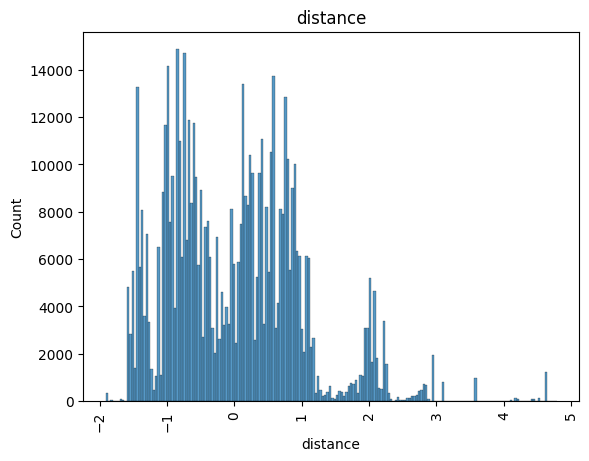

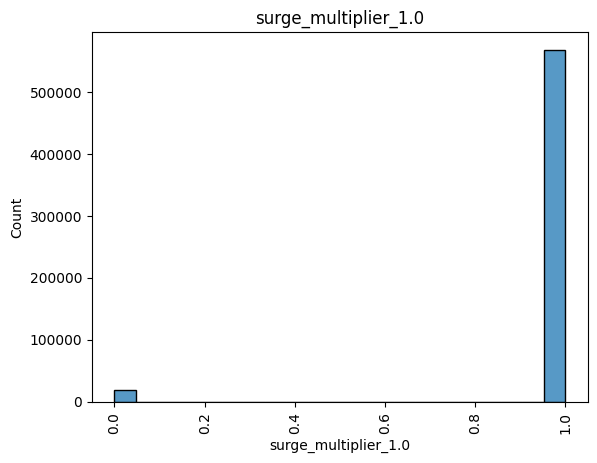

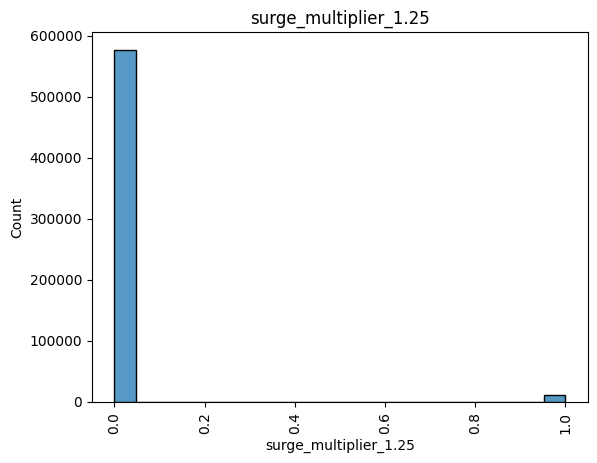

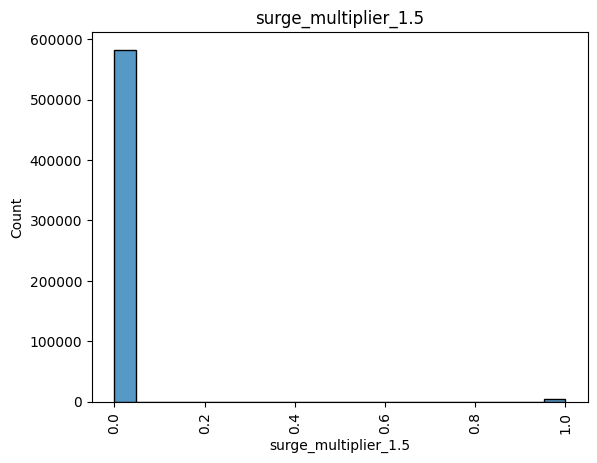

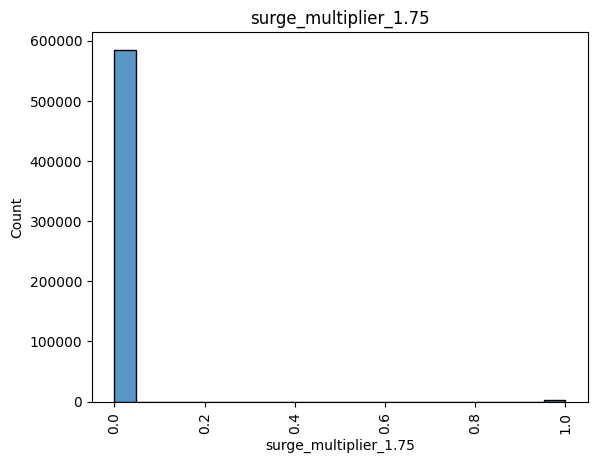

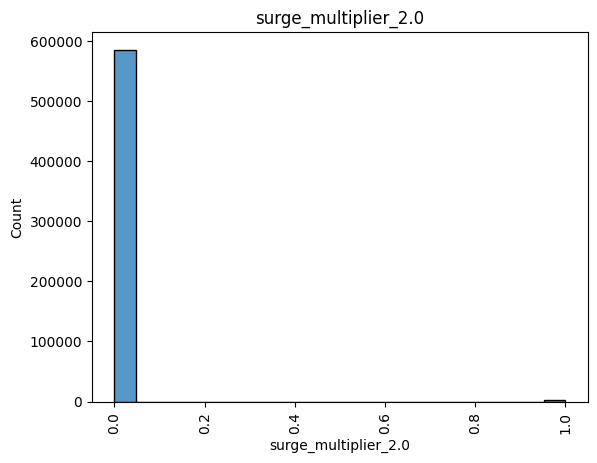

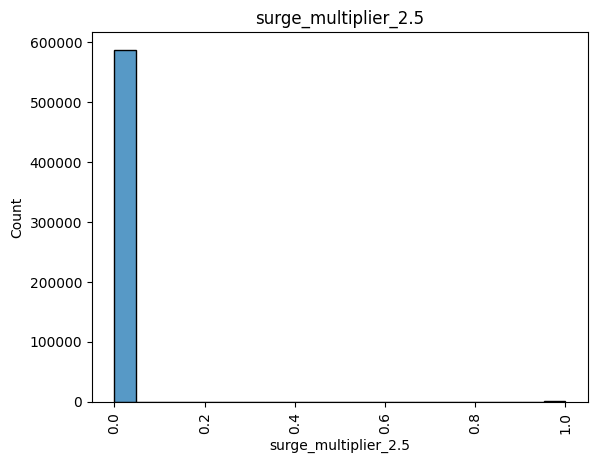

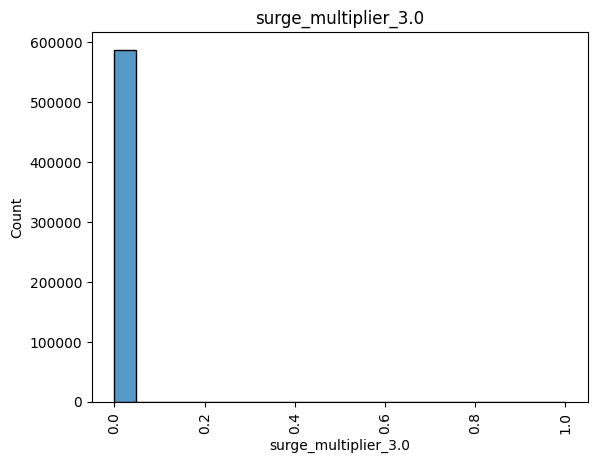

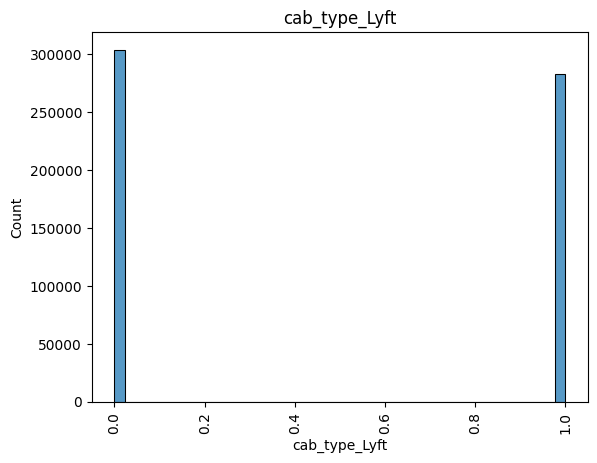

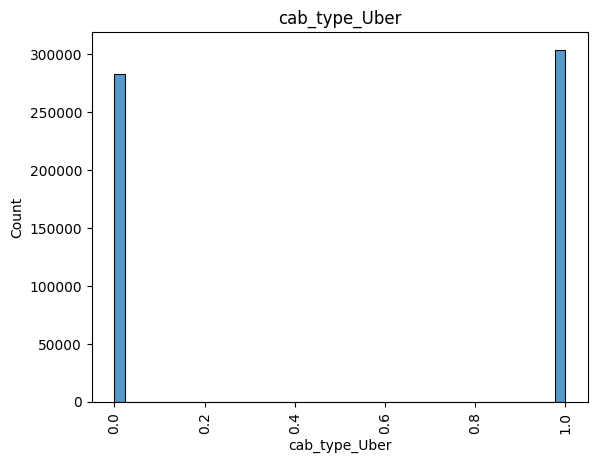

In [207]:
histogram(X)

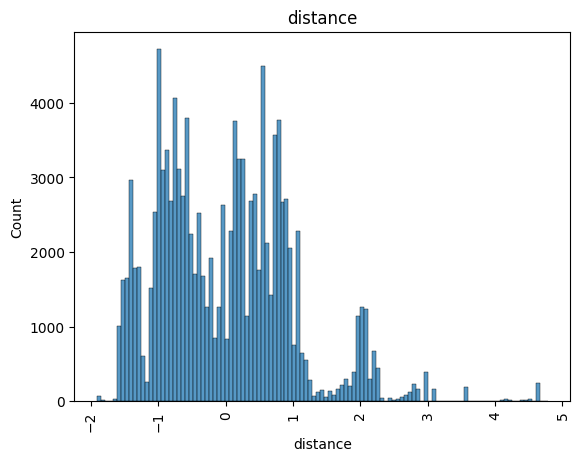

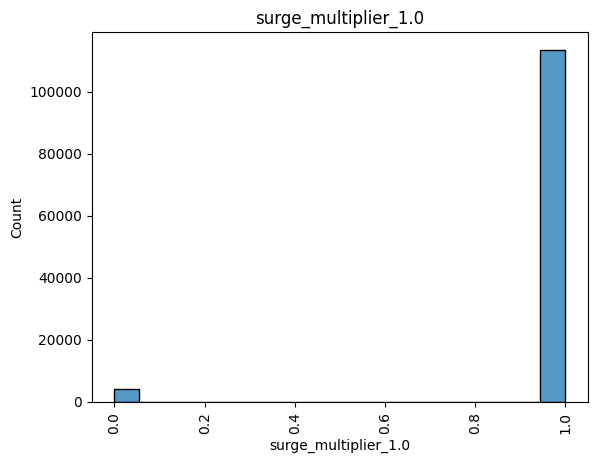

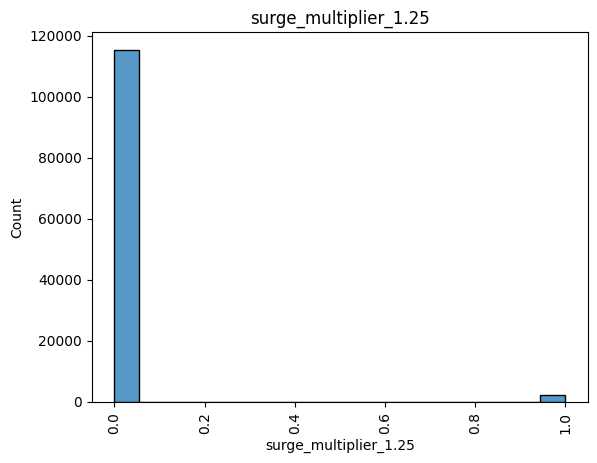

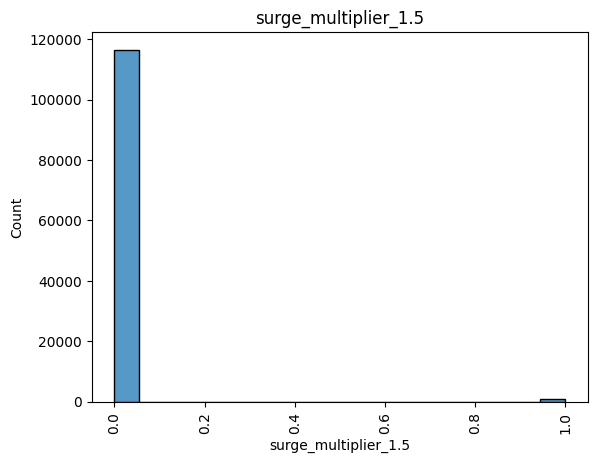

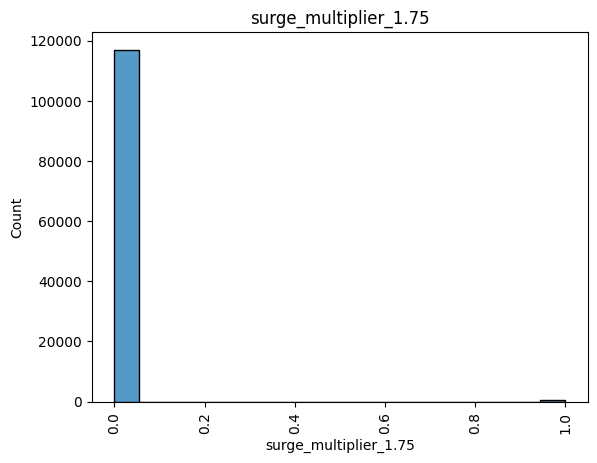

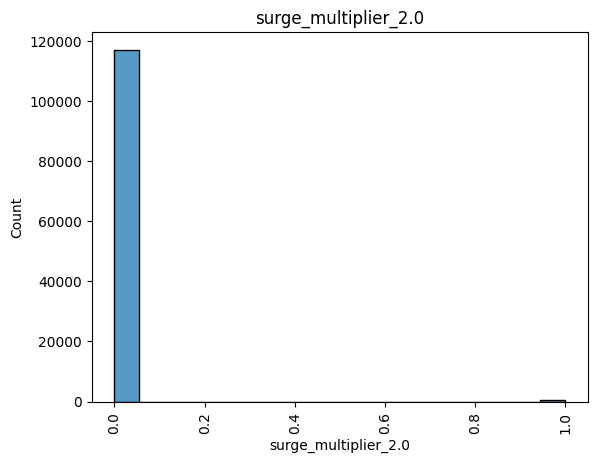

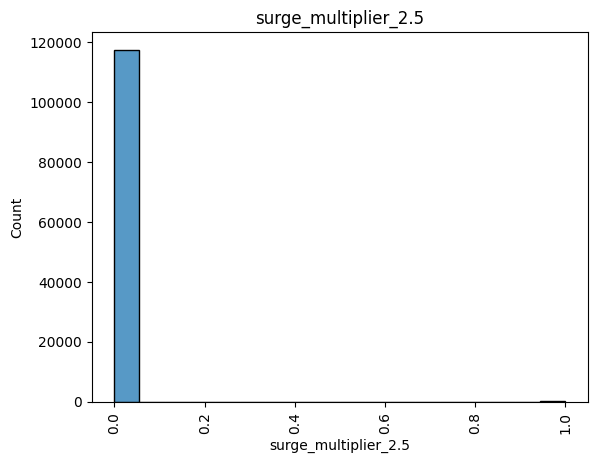

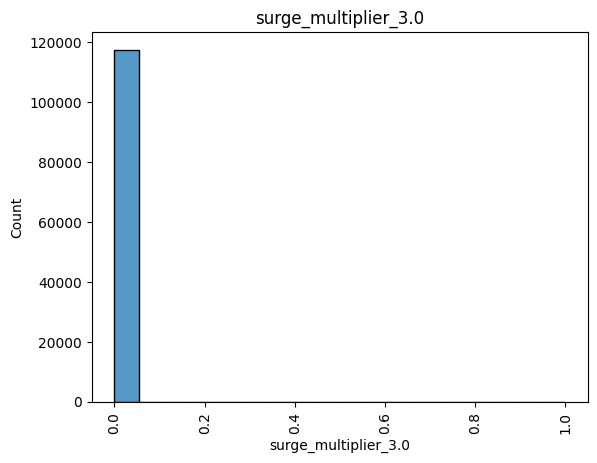

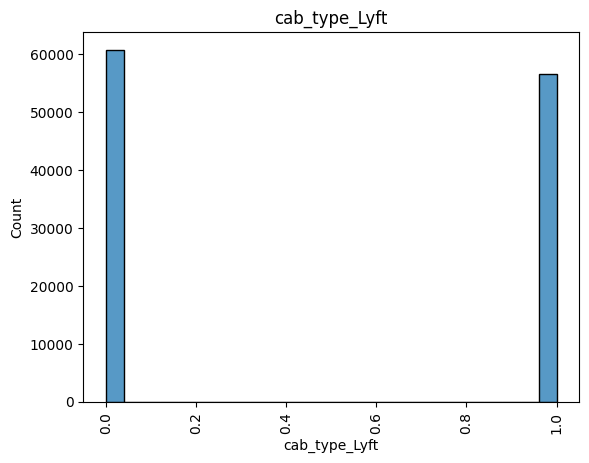

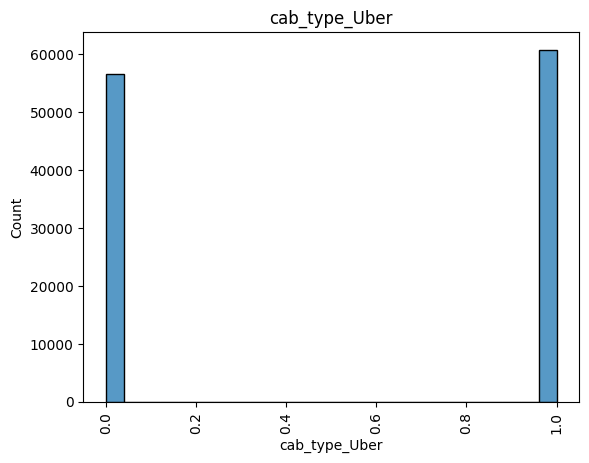

In [208]:
histogram(X_test)

## Since the distributions are similar for the complete dataset and test set, it can be said that the test data is representative of the whole dataset


In [209]:
original_target_mean = np.mean(y)
original_target_std = np.std(y)

# Calculate the distribution of target values in the test set
test_target_mean = np.mean(y_test)
test_target_std = np.std(y_test)

# Print the results
print("Original Dataset: Target mean: {:.2f}, Target standard deviation: {:.2f}".format(original_target_mean, original_target_std))
print("Test Set: Target mean: {:.2f}, Target standard deviation: {:.2f}".format(test_target_mean, test_target_std))


Original Dataset: Target mean: -0.00, Target standard deviation: 1.00
Test Set: Target mean: 0.00, Target standard deviation: 1.00


## Since the statistical distributions are similar for the complete dataset and test set, it can be said that the test data is representative of the whole dataset

-------

# E) Fix - Added loss x iteration graphs and cross validation scores for all models

## Train  a  Linear  Regression  model  using  the  training  data  with  four-fold  cross-validation using appropriate evaluation metric

## Linear regression

In [210]:
model = LinearRegression()

In [211]:
n_folds = 4
train_mse_list = []
val_mse_list = []

iterations = []


In [212]:
kf = KFold(n_splits=n_folds, shuffle=True, random_state=42)

In [213]:
for train_index, val_index in kf.split(X_train):
    # Split the data into training and validation sets for the current fold
    X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Fit the model to the training data
    model.fit(X_train_fold, y_train_fold)
    
    # Predict the target values for training and validation data
    y_train_pred = model.predict(X_train_fold)
    y_val_pred = model.predict(X_val_fold)
    
    # Calculate the MSE for training and validation data
    train_mse = mean_squared_error(y_train_fold, y_train_pred)
    val_mse = mean_squared_error(y_val_fold, y_val_pred)
    
    # Append the MSE values to the lists
    train_mse_list.append(train_mse)
    val_mse_list.append(val_mse)



In [214]:
avg_train_mse = np.mean(train_mse_list)
avg_val_mse = np.mean(val_mse_list)

In [215]:
print("Average Train MSE: {:.4f}".format(avg_train_mse))
print("Average Validation MSE: {:.4f}".format(avg_val_mse))


Average Train MSE: 0.8812
Average Validation MSE: 0.8812


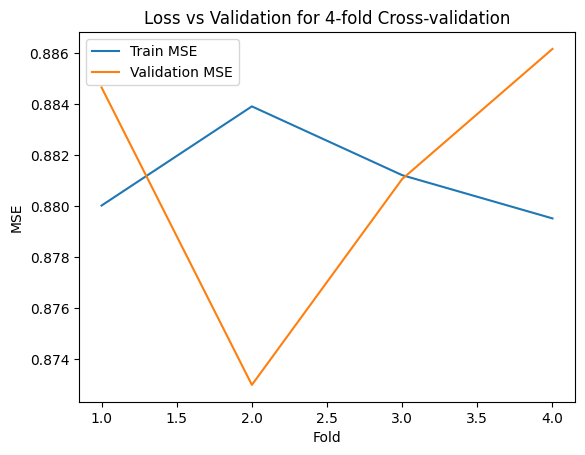

In [216]:
plt.plot(range(1, n_folds + 1), train_mse_list, label='Train MSE')
plt.plot(range(1, n_folds + 1), val_mse_list, label='Validation MSE')
plt.xlabel('Fold')
plt.ylabel('MSE')
plt.title('Loss vs Validation for {}-fold Cross-validation'.format(n_folds))
plt.legend()
plt.show()

In [217]:
from sklearn.metrics import r2_score

reg = LinearRegression()
reg.fit(X_train, y_train)
y_pred = reg.predict(X_val_fold)

r2 = r2_score(y_val_fold, y_pred)

mse = mean_squared_error(y_val_fold, y_pred)

print("R2 score: {:.4f}".format(r2))
print("MSE score for this validation set: {:.4f}".format(mse))

R2 score: 0.1199
MSE score for this validation set: 0.8861


# Do this with closed form solution (using the Normal Equation or SVD) 

Test Mean Squared Error: 0.88465155612059
Test Mean Squared Error: 0.8729917742198876
Test Mean Squared Error: 0.8810655500875617
Test Mean Squared Error: 0.8861867858598136


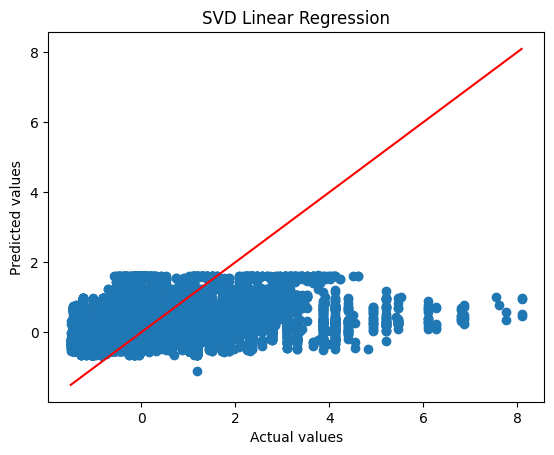

Average MSE for Cross-Validation with SVD: 0.8812


In [218]:
svd_mse = []

threshold = 1e-9

for train_index, val_index in kf.split(X_train):
    X_train_cv, X_val = X_train.iloc[train_index], X_train.iloc[val_index]
    y_train_cv, y_val = y_train.iloc[train_index], y_train.iloc[val_index]

    U, s, V = np.linalg.svd(X_train_cv, full_matrices=False)
    s_thresholded = np.maximum(s, threshold)

# Recalculate the weights with the thresholded singular values
    weights = V.T @ np.diag(1/s_thresholded) @ U.T @ y_train_cv
    
    y_pred = X_val @ weights

    test_mse = np.mean((y_pred - y_val)**2)
    svd_mse.append(test_mse)
    print("Test Mean Squared Error:", test_mse)


plt.scatter(y_val, y_pred)
x_line = np.array([y_val.min(), y_val.max()])
y_line = x_line
plt.plot(x_line, y_line, 'r')

plt.xlabel('Actual values')
plt.ylabel('Predicted values')
plt.title('SVD Linear Regression')
plt.show()

# Calculate the average MSE across all folds
avg_mse = np.mean(svd_mse)

print("Average MSE for Cross-Validation with SVD: {:.4f}".format(avg_mse))

# SGD with different batch sizes and learning rates

In [219]:
import math
from tqdm import tqdm

def get_batches(X,y,batch_size):
    num_train = X.shape[0]

    indices = np.arange(num_train)
    np.random.shuffle(indices)

    for start_idx in range(0,num_train,batch_size):
        #Ensures that we pick the required number of elements till the last element
        end_idx = min(start_idx+batch_size,num_train)
        batch_idx = indices[start_idx:end_idx]

        yield X.values[batch_idx],y.values[batch_idx]

def get_loss(X,y,weights_list:list):
    losses = []
    val_len = X.shape[0]
    for weight in weights_list:
        curr_weight_loss = 0.0
        for validation_data in zip(X.values,y.values):
            X_curr,y_curr = validation_data
            y_pred = X_curr@weight
            curr_weight_loss+=(y_pred[0]-y_curr)**2
        losses.append(curr_weight_loss/val_len)
    return losses

def learning_rate_scheduler(curr_iter:int,initial_lr:float):
    return initial_lr/math.exp(curr_iter)
    
def minibatch_sgd(X,y,batch_size:int=32,lr0:float=0.1,num_epochs:int=100):
    X_train_, X_val_, y_train_, y_val_ = train_test_split(X,y,test_size=0.1,random_state=42,shuffle=True)
    weight_path_sgd = []
    weight = np.random.randn(X_train.shape[1],1) 
    train_loss = []
    # scale = X_train_.shape[0]//batch_size
    for epoch in tqdm(range(num_epochs)):
        batch_iterator = get_batches(X_train_,y_train_,batch_size)
        curr_train_loss = 0.0
        for idx,batches in enumerate(batch_iterator):
            X_curr,y_curr = batches
            y_curr = np.expand_dims(y_curr,axis=1)
            grads = 2/batch_size * X_curr.T.dot(X_curr.dot(weight) - y_curr)
            weight = weight - lr0*grads
        train_loss.append(get_loss(X_train_,y_train_,[weight])[0])
        weight_path_sgd.append(weight)
    val_loss = get_loss(X_val_,y_val_,weight_path_sgd)

    return weight_path_sgd,train_loss,val_loss

In [220]:
_, train_loss, val_loss = minibatch_sgd(X_train,y_train)

100%|█████████████████████████████████████████| 100/100 [01:07<00:00,  1.48it/s]


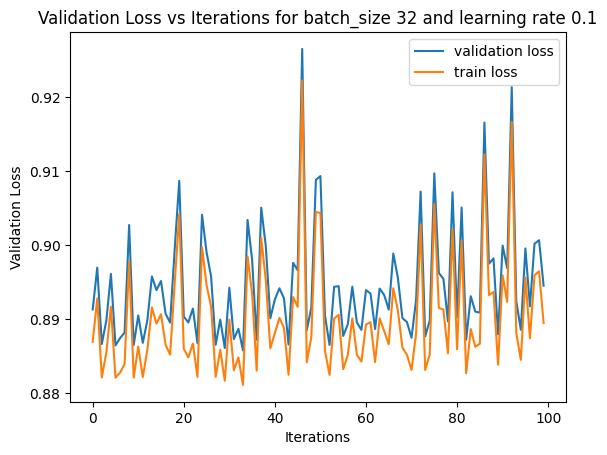

In [221]:
plt.plot(range(len(val_loss)), val_loss)
plt.plot(range(len(train_loss)), train_loss)
plt.xlabel('Iterations')
plt.ylabel('Validation Loss')
plt.title('Validation Loss vs Iterations for batch_size 32 and learning rate 0.1')
plt.legend(['validation loss', 'train loss'])
plt.show()

100%|█████████████████████████████████████████| 100/100 [00:57<00:00,  1.75it/s]


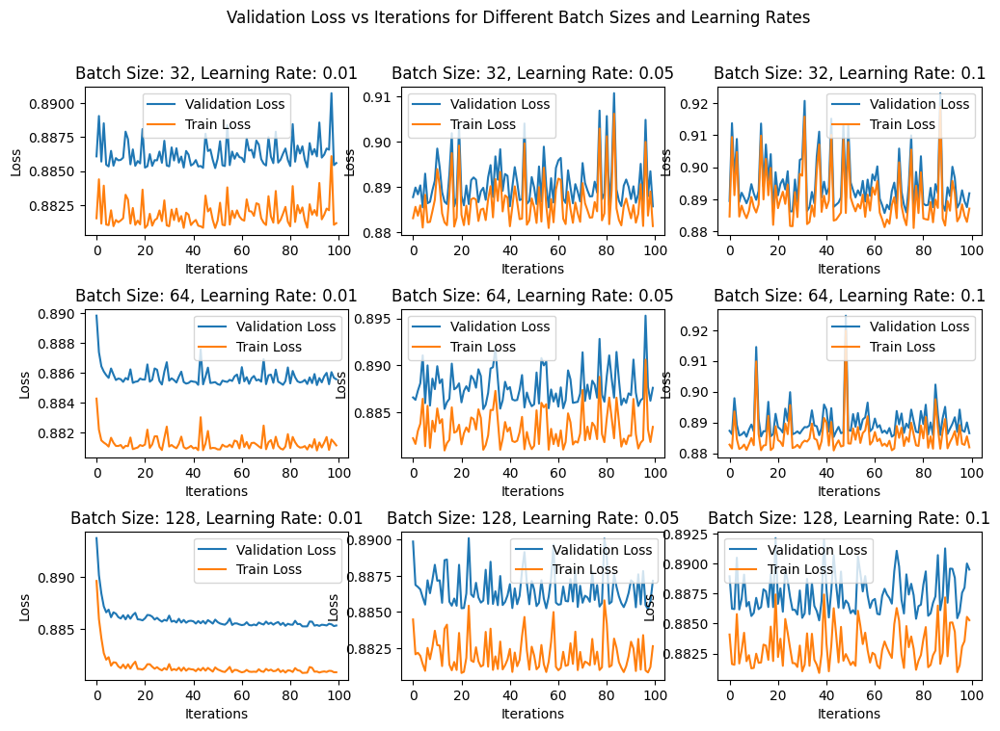

In [222]:
batch_sizes = [32, 64, 128]
etas = [0.01, 0.05, 0.1]

# Create subplots
fig, axes = plt.subplots(len(batch_sizes), len(etas), figsize=(12, 8))

for i, b in enumerate(batch_sizes):
    for j, e in enumerate(etas):
        _, train_loss, val_loss = minibatch_sgd(X_train, y_train, batch_size=b, lr0=e)
        # Plot validation loss on current subplot
        axes[i, j].plot(range(len(val_loss)), val_loss, label='Validation Loss')
        # Plot train loss on current subplot
        axes[i, j].plot(range(len(train_loss)), train_loss, label='Train Loss')
        axes[i, j].set_xlabel('Iterations')
        axes[i, j].set_ylabel('Loss')
        axes[i, j].set_title(f'Batch Size: {b}, Learning Rate: {e}')
        axes[i, j].legend()

# Add a common title for all subplots
fig.suptitle('Validation Loss vs Iterations for Different Batch Sizes and Learning Rates')

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5)

# Show the plot
plt.show()


100%|█████████████████████████████████████████| 100/100 [00:55<00:00,  1.79it/s]


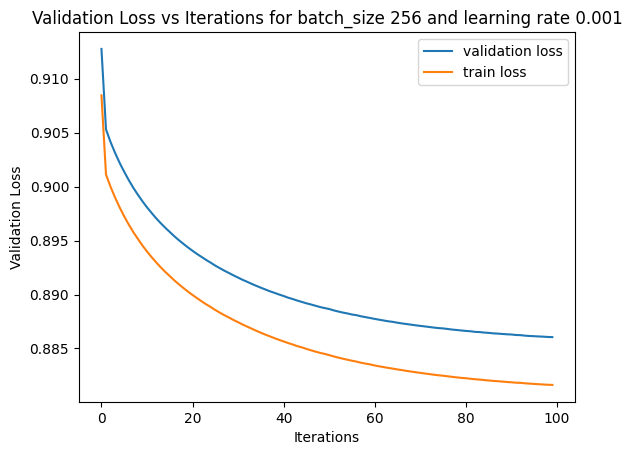

In [223]:
_, train_loss, val_loss = minibatch_sgd(X_train,y_train, batch_size=256, lr0=0.001)
plt.plot(range(len(val_loss)), val_loss)
plt.plot(range(len(train_loss)), train_loss)
plt.xlabel('Iterations')
plt.ylabel('Validation Loss')
plt.title('Validation Loss vs Iterations for batch_size 256 and learning rate 0.001')
plt.legend(['validation loss', 'train loss'])
plt.show()

### We can see that increasing the batch size and decreasing the learning rate leads to the best results

# Perform Ridge, Lasso and Elastic Net regularization – try a  few  values  of  penalty  term  and  describe  its  impact.

## With different penalty values

In [224]:
def regularization(X, y, alpha, learning_rate, num_folds=4, num_iterations=100, penalty=None):
    X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.2,random_state=42,shuffle=True)
    model = SGDRegressor(penalty=penalty, eta0 = learning_rate, alpha=alpha, max_iter=num_iterations, warm_start=True)
    train_loss = []
    val_loss = []
    iteration = []
    for i in range(num_iterations):
        #X_train, y_train = shuffle(X_train,y_train)
        model.partial_fit(X_train, y_train)
        pred_train = model.predict(X_train)
        pred_val = model.predict(X_val)
        train_loss.append(mean_squared_error(pred_train, y_train))
        val_loss.append(mean_squared_error(pred_val, y_val))
        iteration.append(i)
    return train_loss, val_loss

For learning rate,0.001
For learning rate,0.01
For learning rate,0.1


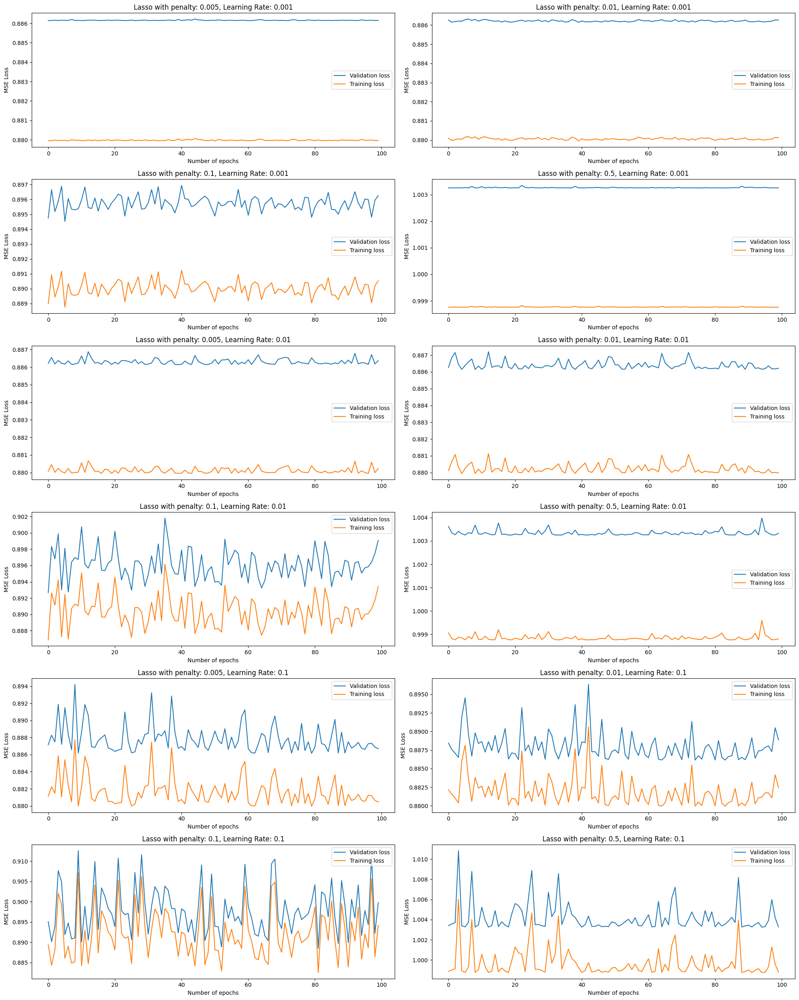

In [225]:
penalty = [0.005, 0.01, 0.1, 0.5]
learning_rate = [0.001,0.01,0.1]
fig, axes = plt.subplots(nrows=6, ncols=2, figsize=(20, 25))
for ii, learning in enumerate(learning_rate):
    print("For learning rate," + str(learning))
    for i, pen in enumerate(penalty):
        train_loss, val_loss = regularization(X_train, y_train, pen, learning, penalty = "l1")
        row = ii * 2 + i // 2
        col = i % 2
        axes[row, col].plot(range(len(val_loss)), val_loss, label="Validation loss")
        axes[row, col].plot(range(len(train_loss)), train_loss,label="Training loss")
        axes[row, col].set_xlabel("Number of epochs")
        axes[row, col].set_ylabel("MSE Loss")
        axes[row, col].set_title(f"Lasso with penalty: {pen}, Learning Rate: {learning}")
        #axes[0, col].set_title(f"Lasso with penalty: {pen}, Learning Rate: {learning}")
        axes[row, col].legend()

plt.tight_layout()
plt.show()

## we see that the curves are not smooth. While, in most cases the training and validation errors are pretty similar, the noisy nature of the curves is suspect. We check how the errors change inside a single iteration in the next step

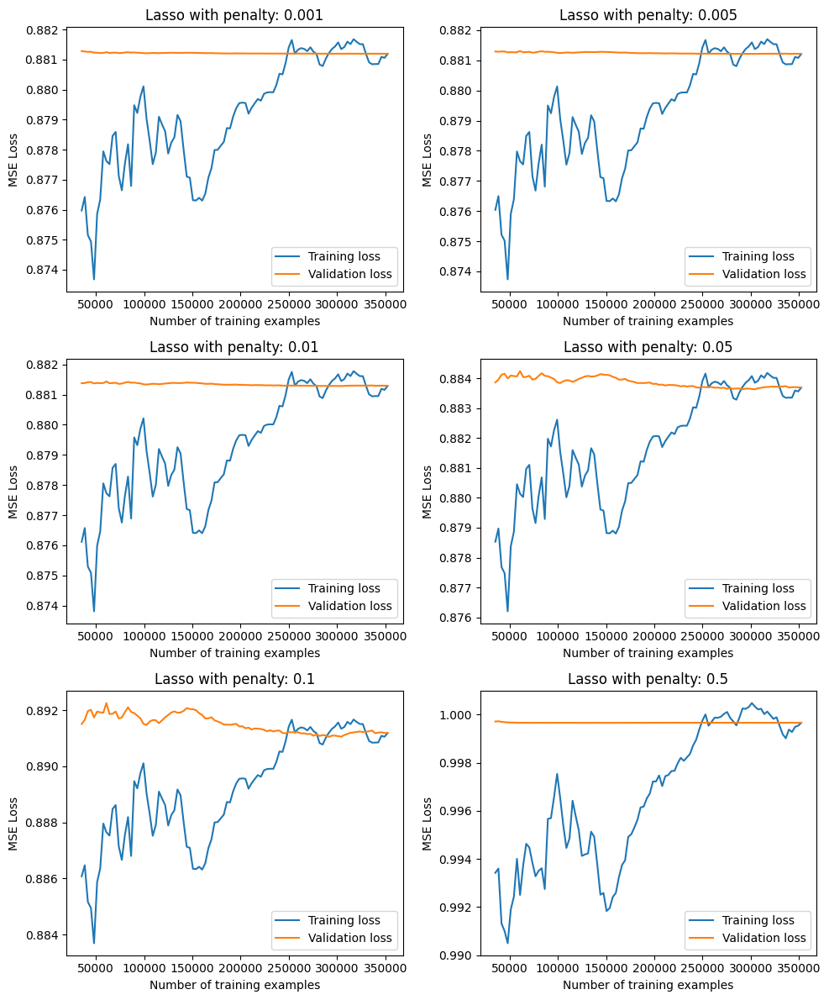

In [226]:
penalty = [0.001, 0.005, 0.01, 0.05, 0.1, 0.5]

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10, 12))

for i, pen in enumerate(penalty):
    # Plot for Lasso
    lasso_model = Lasso(alpha=pen)
    cross_validate_score = cross_validate(lasso_model, X_train, y_train, scoring="neg_mean_squared_error", cv=4, return_train_score=True)
    train_sizes, train_loss, val_loss = learning_curve(lasso_model, X_train, y_train, scoring="neg_mean_squared_error", cv=4, train_sizes = np.linspace(0.1,1.0,100))
    row = i // 2
    col = i % 2
    axes[row, col].plot(train_sizes, -train_loss.mean(axis=1), label="Training loss")
    axes[row, col].plot(train_sizes, -val_loss.mean(axis=1), label="Validation loss")
    axes[row, col].set_xlabel("Number of training examples")
    axes[row, col].set_ylabel("MSE Loss")
    axes[row, col].set_title(f"Lasso with penalty: {pen}")
    axes[row, col].legend()

plt.tight_layout()
plt.show()


For learning rate,0.001
For learning rate,0.01
For learning rate,0.1


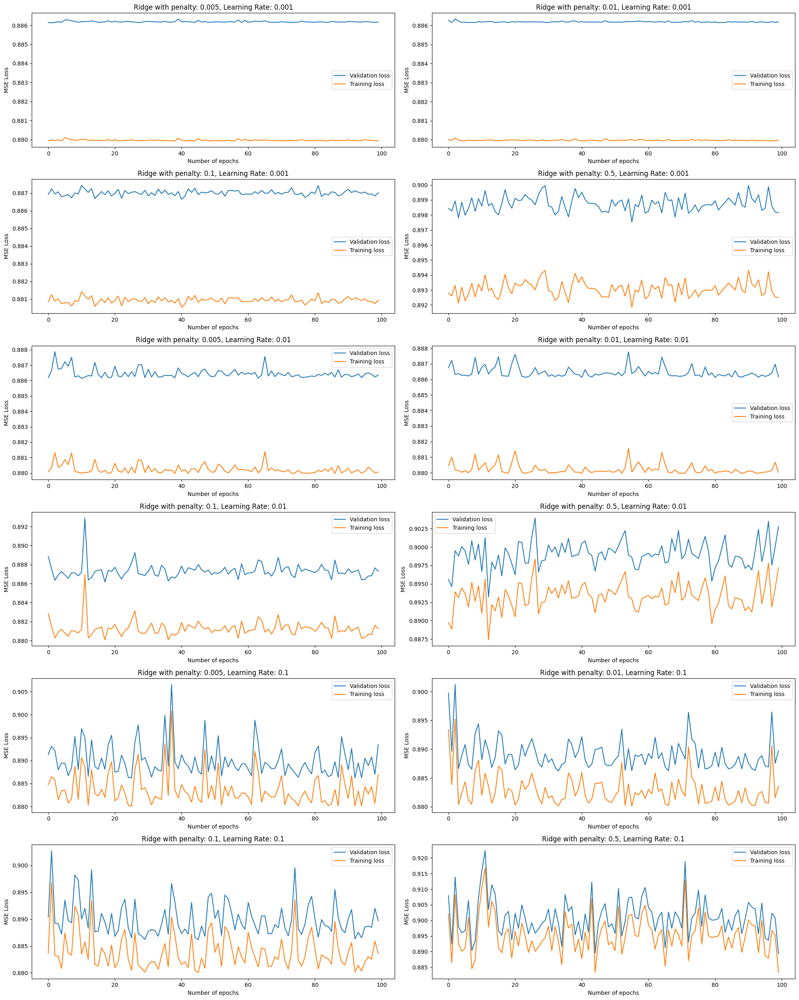

In [227]:
penalty = [0.005, 0.01, 0.1, 0.5]
learning_rate = [0.001,0.01,0.1]
fig, axes = plt.subplots(nrows=6, ncols=2, figsize=(20, 25))
for ii, learning in enumerate(learning_rate):
    print("For learning rate," + str(learning))
    for i, pen in enumerate(penalty):
        train_loss, val_loss = regularization(X_train, y_train, pen, learning, penalty = "l2")
        row = ii * 2 + i // 2
        col = i % 2
        axes[row, col].plot(range(len(val_loss)), val_loss, label="Validation loss")
        axes[row, col].plot(range(len(train_loss)), train_loss,label="Training loss")
        axes[row, col].set_xlabel("Number of epochs")
        axes[row, col].set_ylabel("MSE Loss")
        axes[row, col].set_title(f"Ridge with penalty: {pen}, Learning Rate: {learning}")
        #axes[0, col].set_title(f"Lasso with penalty: {pen}, Learning Rate: {learning}")
        axes[row, col].legend()

plt.tight_layout()
plt.show()

## we see that the curves are not smooth. While, in most cases the training and validation errors are pretty similar, the noisy nature of the curves is suspect. We check how the errors change inside a single iteration in the next step

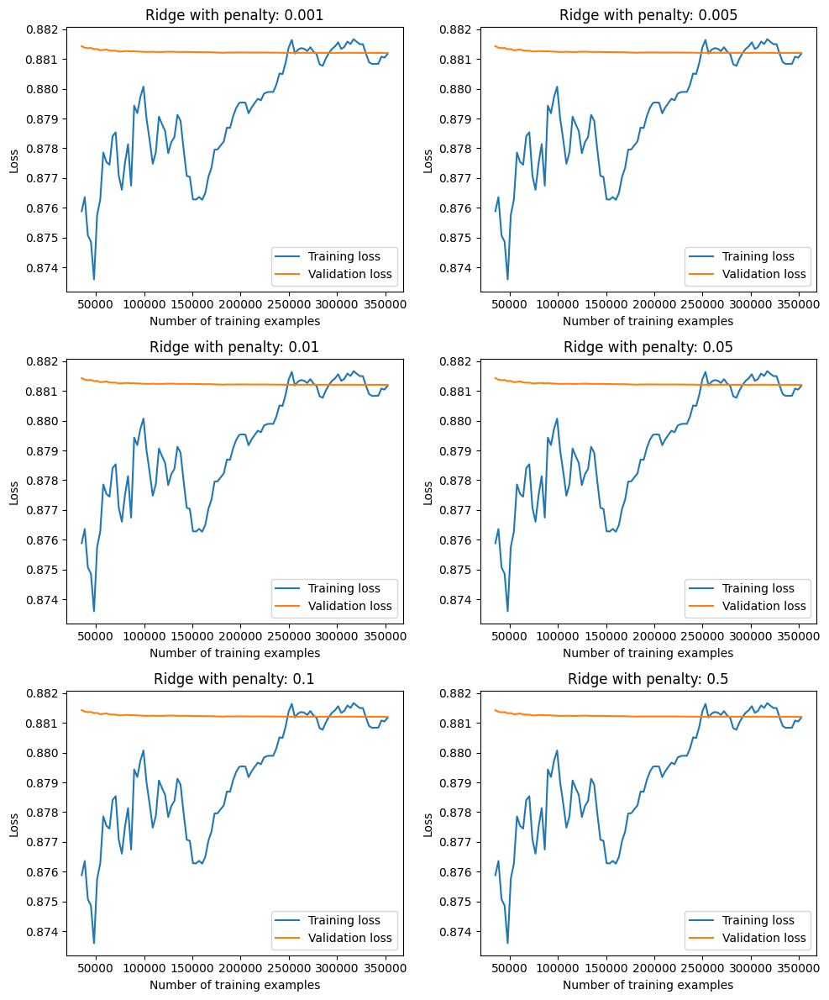

In [243]:
penalty = [0.001, 0.005, 0.01, 0.05, 0.1, 0.5]

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10, 12))

for i, pen in enumerate(penalty):
    # Plot for Ridge
    ridge_model = Ridge(alpha=pen, solver="cholesky")
    cross_validate_score = cross_validate(ridge_model, X_train, y_train, scoring="neg_mean_squared_error", cv=4, return_train_score=True)
    train_sizes, train_loss, val_loss = learning_curve(ridge_model, X_train, y_train, scoring="neg_mean_squared_error", cv=4,train_sizes = np.linspace(0.1,1.0,100))
    row = i // 2
    col = i % 2
    axes[row, col].plot(train_sizes, -train_loss.mean(axis=1), label="Training loss")
    axes[row, col].plot(train_sizes, -val_loss.mean(axis=1), label="Validation loss")
    axes[row, col].set_xlabel("Number of training examples")
    axes[row, col].set_ylabel("Loss")
    axes[row, col].set_title(f"Ridge with penalty: {pen}")
    axes[row, col].legend()

plt.tight_layout()
plt.show()

For learning rate,0.001
For learning rate,0.01
For learning rate,0.1


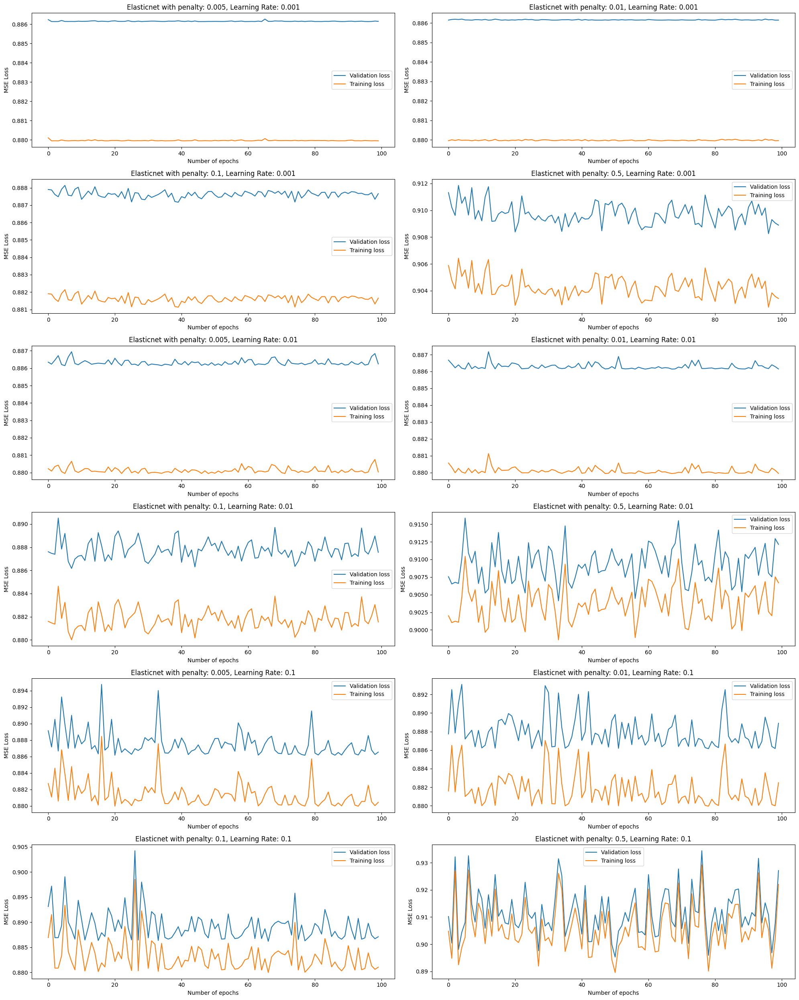

In [244]:
penalty = [0.005, 0.01, 0.1, 0.5]
learning_rate = [0.001,0.01,0.1]
fig, axes = plt.subplots(nrows=6, ncols=2, figsize=(20, 25))
for ii, learning in enumerate(learning_rate):
    print("For learning rate," + str(learning))
    for i, pen in enumerate(penalty):
        train_loss, val_loss = regularization(X_train, y_train, pen, learning, penalty = "elasticnet")
        row = ii * 2 + i // 2
        col = i % 2
        axes[row, col].plot(range(len(val_loss)), val_loss, label="Validation loss")
        axes[row, col].plot(range(len(train_loss)), train_loss,label="Training loss")
        axes[row, col].set_xlabel("Number of epochs")
        axes[row, col].set_ylabel("MSE Loss")
        axes[row, col].set_title(f"Elasticnet with penalty: {pen}, Learning Rate: {learning}")
        #axes[0, col].set_title(f"Lasso with penalty: {pen}, Learning Rate: {learning}")
        axes[row, col].legend()

plt.tight_layout()
plt.show()

## we see that the curves are not smooth. While, in most cases the training and validation errors are pretty similar, the noisy nature of the curves is suspect. We check how the errors change inside a single iteration in the next step

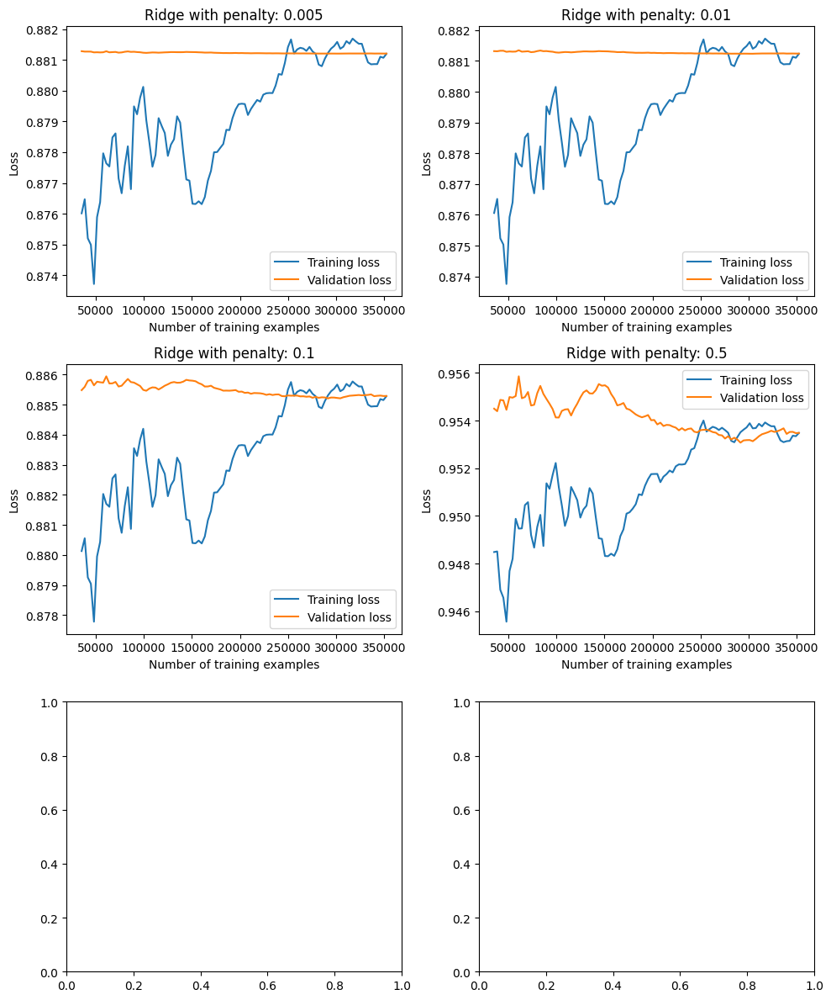

In [245]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10, 12))

for i, pen in enumerate(penalty):
    # Plot for Elastic Net
    elastic_model = ElasticNet(alpha=pen, l1_ratio=0.5)
    cross_validate_score = cross_validate(elastic_model, X_train, y_train, scoring="neg_mean_squared_error", cv=4, return_train_score=True)
    train_sizes, train_loss, val_loss = learning_curve(elastic_model, X_train, y_train, scoring="neg_mean_squared_error", cv=4,train_sizes = np.linspace(0.1,1.0,100))
    row = i // 2
    col = i % 2
    axes[row, col].plot(train_sizes, -train_loss.mean(axis=1), label="Training loss")
    axes[row, col].plot(train_sizes, -val_loss.mean(axis=1), label="Validation loss")
    axes[row, col].set_xlabel("Number of training examples")
    axes[row, col].set_ylabel("Loss")
    axes[row, col].set_title(f"Ridge with penalty: {pen}")
    axes[row, col].legend()

plt.tight_layout()
plt.show()

## The above graphs showcase the training vs validation loss for the dataset for different checkpoints in the training data. 

## What learning_curve does is create 100 checkpoints in the data. For example, it will first take 1% of the data and perform 4fold cross validation on it. Then it will take 2% and then 3 and so on. We plot the mean of the 4 fold error for each point and plot it

# Describe your findings.

    - SGD: For lower batch size and high learning rate we see that the data is severely underfitting. Only when we increase the batch size and reduce the learning rate that our model fits properly.
    
     - Lasso: As the penalty (alpha) increases, the validation error increases, indicating that higher penalties result in more regularization and may lead to underfitting. Lower penalties result in better performance in terms of validation error. Alpha = 0.1 gives the best results. 

    - Ridge: The validation error remains relatively constant with changes in the penalty, indicating that Ridge regularization is not as sensitive to the choice of penalty as Lasso. However, a higher penalty may still result in slightly higher validation error. alpha = 0.5 gives the best result

    - Elastic Net: Similar to Lasso, lower penalties lead to better performance in terms of validation error. The L1 ratio is set to 0.5, meaning that Elastic Net is a combination of Lasso (L1 regularization) and Ridge (L2 regularization). The behavior of Elastic Net is similar to that of Lasso, but with a smoother transition between L1 and L2 regularization as the penalty increases. Penalty of 0.5 gives the best results.



# The Validation and the training loss converge hence, the model is not overfitting. 


# Polynomial regression

In [229]:
poly = PolynomialFeatures(degree=3, include_bias=True)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

In [230]:
X_poly = pd.DataFrame(X_train_poly)
X_testpoly = pd.DataFrame(X_test_poly)

In [231]:
X_poly.shape

(469865, 286)

In [186]:
n_folds = 4
train_mse_list = []
val_mse_list = []

iterations = []
model = LinearRegression()

In [187]:
for train_index, val_index in kf.split(X_poly):
    # Split the data into training and validation sets for the current fold
    X_train_fold, X_val_fold = X_poly.iloc[train_index], X_poly.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Fit the model to the training data
    model.fit(X_train_fold, y_train_fold)
    
    # Predict the target values for training and validation data
    y_train_pred = model.predict(X_train_fold)
    y_val_pred = model.predict(X_val_fold)
    
    # Calculate the MSE for training and validation data
    train_mse = mean_squared_error(y_train_fold, y_train_pred)
    val_mse = mean_squared_error(y_val_fold, y_val_pred)
    
    # Append the MSE values to the lists
    train_mse_list.append(train_mse)
    val_mse_list.append(val_mse)

avg_train_mse = np.mean(train_mse_list)
avg_val_mse = np.mean(val_mse_list)
print("Average Train MSE: {:.4f}".format(avg_train_mse))
print("Average Validation MSE: {:.4f}".format(avg_val_mse))

Average Train MSE: 0.8788
Average Validation MSE: 0.8791


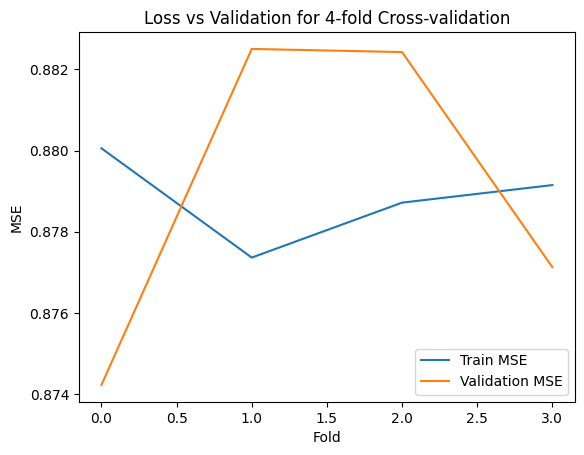

In [188]:
plt.plot(range(len(train_mse_list)), train_mse_list, label='Train MSE')
plt.plot(range(len(val_mse_list)), val_mse_list, label='Validation MSE')
plt.xlabel('Fold')
plt.ylabel('MSE')
plt.title('Loss vs Validation for {}-fold Cross-validation'.format(n_folds))
plt.legend()
plt.show()

In [233]:
def regularization(X, y, alpha, learning_rate, num_folds=4, num_iterations=100, penalty=None):
    X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.2,random_state=42,shuffle=True)
    model = SGDRegressor(penalty=penalty, eta0 = learning_rate, alpha=alpha, max_iter=num_iterations, warm_start=True,loss = "squared_error")
    train_loss = []
    val_loss = []
    iteration = []
    for i in range(num_iterations):
        #X_train, y_train = shuffle(X_train,y_train)
        model.partial_fit(X_train, y_train)
        pred_train = model.predict(X_train)
        pred_val = model.predict(X_val)
        train_loss.append(mean_squared_error(pred_train, y_train))
        val_loss.append(mean_squared_error(pred_val, y_val))
        iteration.append(i)
    return train_loss, val_loss

For learning rate,0.001
For learning rate,0.01
For learning rate,0.1


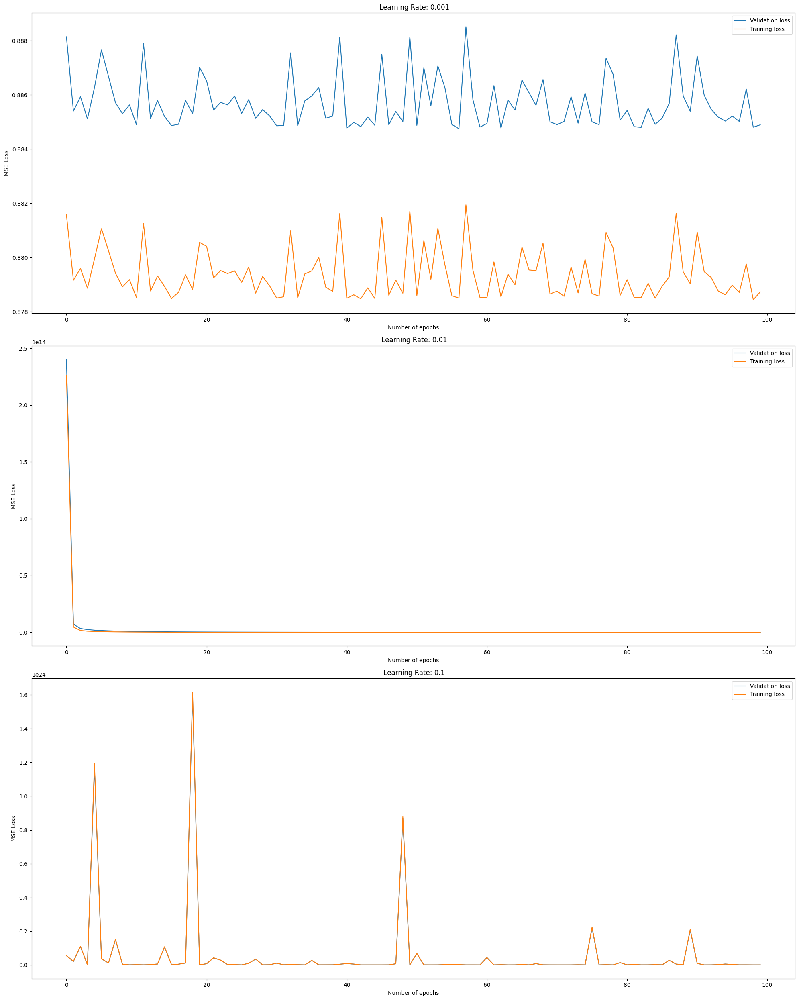

In [237]:

learning_rate = [0.001,0.01,0.1]
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(20, 25))
for ii, learning in enumerate(learning_rate):
    print("For learning rate," + str(learning))
    train_loss, val_loss = regularization(X_poly, y_train, pen, learning)
    row = ii
    col = 0
    axes[row].plot(range(len(val_loss)), val_loss, label="Validation loss")
    axes[row].plot(range(len(train_loss)), train_loss,label="Training loss")
    axes[row].set_xlabel("Number of epochs")
    axes[row].set_ylabel("MSE Loss")
    axes[row].set_title(f" Learning Rate: {learning}")
        #axes[0, col].set_title(f"Lasso with penalty: {pen}, Learning Rate: {learning}")
    axes[row].legend()

plt.tight_layout()
plt.show()

## The model is not overfitting even with degree 3 since it is very sparse and this property is continued in the polynomial data as well. 

In [242]:
kf = KFold(n_splits=4)

train_mse=[]
val_mse = []
# Divide the data into 4 folds
for train_index, val_index in kf.split(X_poly):
    X_traincv, X_val = X_poly.iloc[train_index], X_poly.iloc[val_index]
    y_traincv, y_val = y_train.iloc[train_index], y_train.iloc[val_index]
    # Fit a linear regression model using normal equation/SVD
    regression_model = LinearRegression()
    regression_model.fit(X_traincv, y_traincv)
    y_pred = regression_model.predict(X_val)
    val_mse.append(mean_squared_error(y_val, y_pred))
    train_mse.append(mean_squared_error(y_traincv, regression_model.predict(X_traincv)))
    


In [93]:
train_mse, val_mse

([0.8782587165237156,
  0.8792059577673066,
  0.8787333485328633,
  0.8792543902762313],
 [0.8807707267157289,
  0.8779025049133077,
  0.8795075774145017,
  0.8779946599813556])

In [94]:
np.mean(train_mse), np.mean(val_mse)

(0.8788631032750293, 0.8790438672562234)

For learning rate,0.001
For learning rate,0.01
For learning rate,0.1


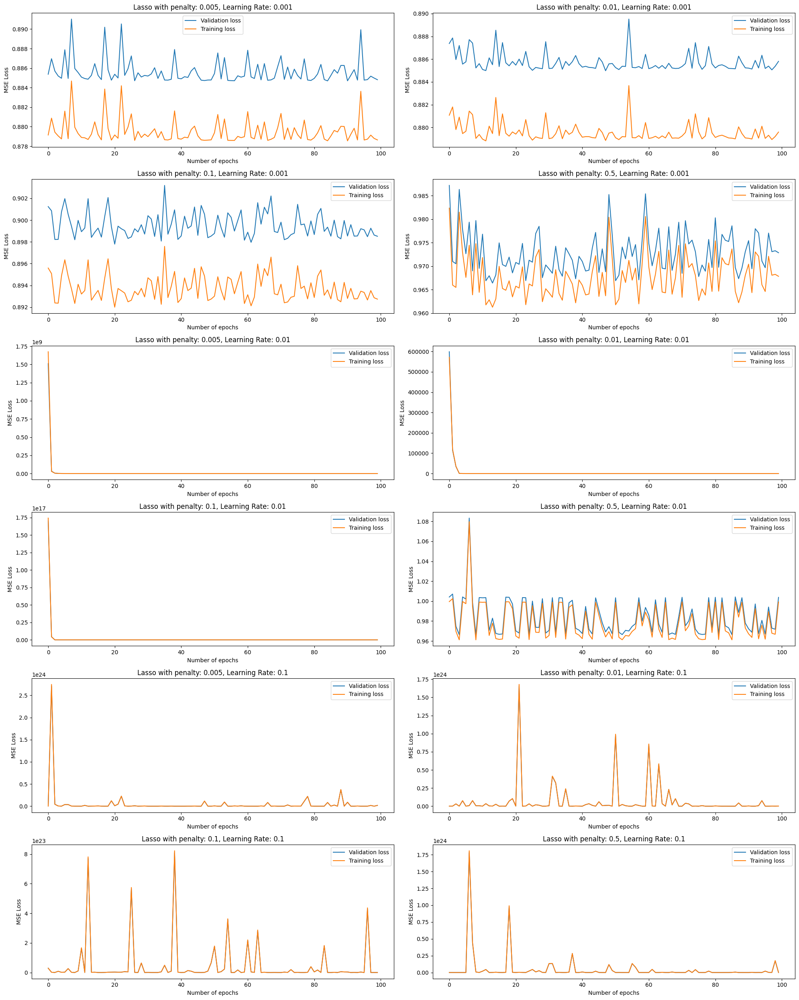

In [238]:
penalty = [0.005, 0.01, 0.1, 0.5]
learning_rate = [0.001,0.01,0.1]
fig, axes = plt.subplots(nrows=6, ncols=2, figsize=(20, 25))
for ii, learning in enumerate(learning_rate):
    print("For learning rate," + str(learning))
    for i, pen in enumerate(penalty):
        train_loss, val_loss = regularization(X_poly, y_train, pen, learning, penalty = "l1")
        row = ii * 2 + i // 2
        col = i % 2
        axes[row, col].plot(range(len(val_loss)), val_loss, label="Validation loss")
        axes[row, col].plot(range(len(train_loss)), train_loss,label="Training loss")
        axes[row, col].set_xlabel("Number of epochs")
        axes[row, col].set_ylabel("MSE Loss")
        axes[row, col].set_title(f"Lasso with penalty: {pen}, Learning Rate: {learning}")
        #axes[0, col].set_title(f"Lasso with penalty: {pen}, Learning Rate: {learning}")
        axes[row, col].legend()

plt.tight_layout()
plt.show()

For learning rate,0.001
For learning rate,0.01
For learning rate,0.1


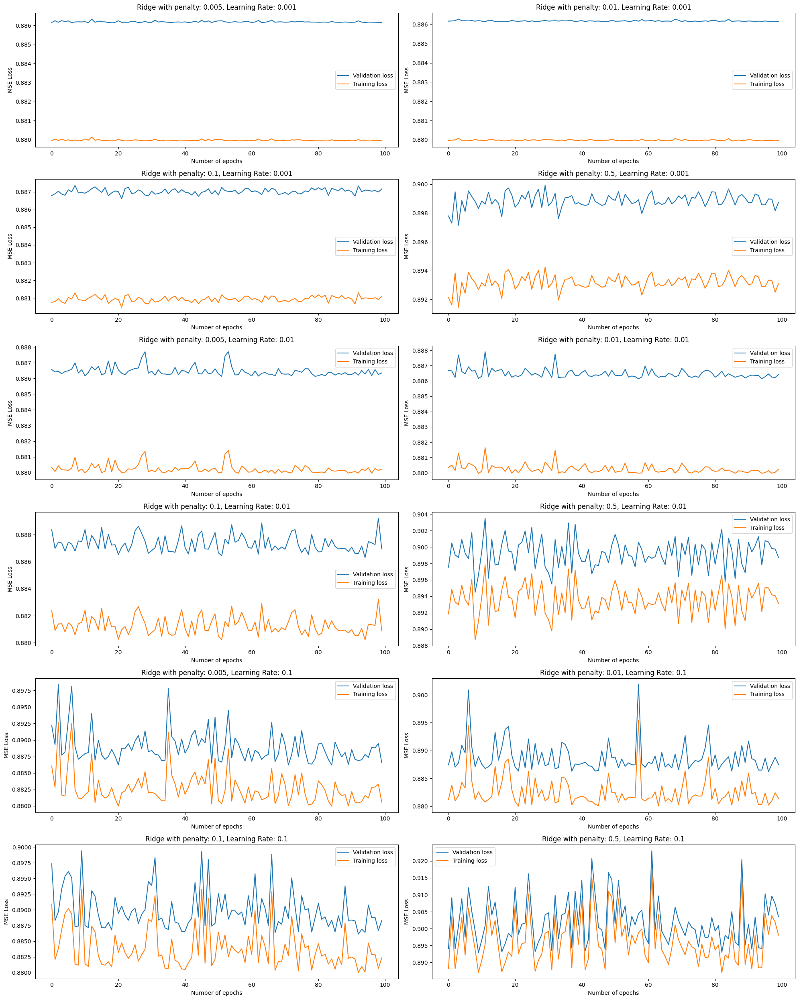

In [239]:
penalty = [0.005, 0.01, 0.1, 0.5]
learning_rate = [0.001,0.01,0.1]
fig, axes = plt.subplots(nrows=6, ncols=2, figsize=(20, 25))
for ii, learning in enumerate(learning_rate):
    print("For learning rate," + str(learning))
    for i, pen in enumerate(penalty):
        train_loss, val_loss = regularization(X_train, y_train, pen, learning, penalty = "l2")
        row = ii * 2 + i // 2
        col = i % 2
        axes[row, col].plot(range(len(val_loss)), val_loss, label="Validation loss")
        axes[row, col].plot(range(len(train_loss)), train_loss,label="Training loss")
        axes[row, col].set_xlabel("Number of epochs")
        axes[row, col].set_ylabel("MSE Loss")
        axes[row, col].set_title(f"Ridge with penalty: {pen}, Learning Rate: {learning}")
        #axes[0, col].set_title(f"Lasso with penalty: {pen}, Learning Rate: {learning}")
        axes[row, col].legend()

plt.tight_layout()
plt.show()

For learning rate,0.001
For learning rate,0.01
For learning rate,0.1


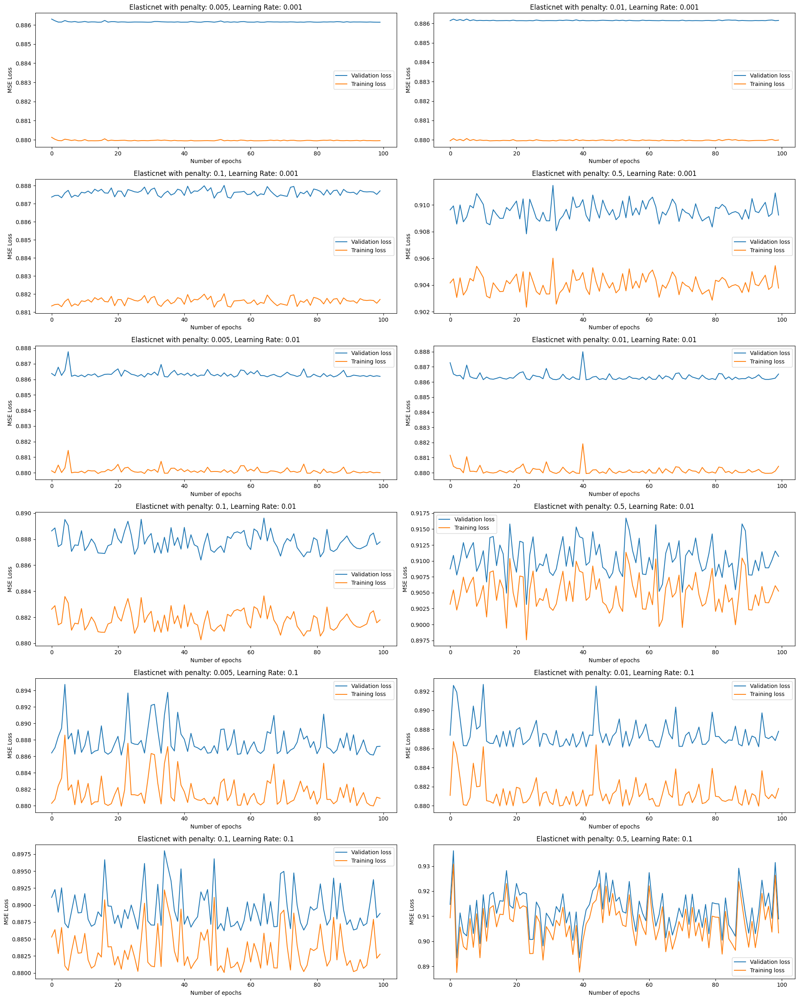

In [240]:
penalty = [0.005, 0.01, 0.1, 0.5]
learning_rate = [0.001,0.01,0.1]
fig, axes = plt.subplots(nrows=6, ncols=2, figsize=(20, 25))
for ii, learning in enumerate(learning_rate):
    print("For learning rate," + str(learning))
    for i, pen in enumerate(penalty):
        train_loss, val_loss = regularization(X_train, y_train, pen, learning, penalty = "elasticnet")
        row = ii * 2 + i // 2
        col = i % 2
        axes[row, col].plot(range(len(val_loss)), val_loss, label="Validation loss")
        axes[row, col].plot(range(len(train_loss)), train_loss,label="Training loss")
        axes[row, col].set_xlabel("Number of epochs")
        axes[row, col].set_ylabel("MSE Loss")
        axes[row, col].set_title(f"Elasticnet with penalty: {pen}, Learning Rate: {learning}")
        #axes[0, col].set_title(f"Lasso with penalty: {pen}, Learning Rate: {learning}")
        axes[row, col].legend()

plt.tight_layout()
plt.show()

In [98]:
polynomial_regression = LinearRegression()
polynomial_lasso = Lasso(alpha = 0.001)
polynomial_ridge = Ridge(alpha=0.001, solver="cholesky")
polynomial_elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.5)

LinearRegression()
training loss: 0.8788631032750293
Validation loss: 0.8790438672562234
________


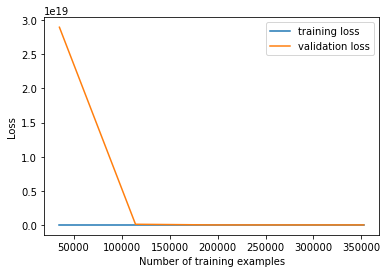

Lasso(alpha=0.001)
training loss: 0.8788466587838597
Validation loss: 0.8788932902854918
________


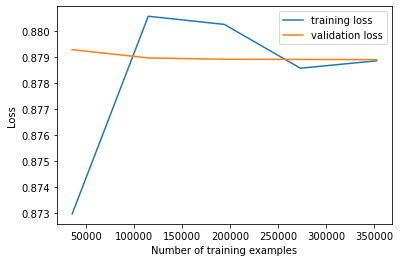

Ridge(alpha=0.001, solver='cholesky')
training loss: 0.8787926685337993
Validation loss: 0.8790161415811133
________


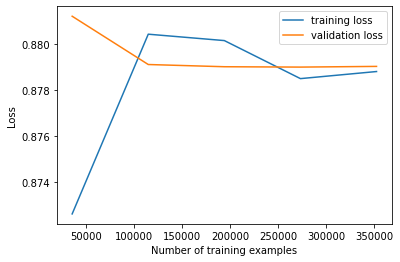

ElasticNet(alpha=0.001)
training loss: 0.8788401953139835
Validation loss: 0.8788988154543035
________


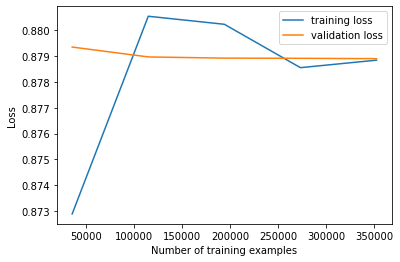

In [115]:
models = [polynomial_regression,polynomial_lasso,polynomial_ridge,polynomial_elastic_net]
for model in models:
    print(model)
    cross_validate_score = cross_validate(model, X_poly, y_train, scoring="neg_mean_squared_error", cv=4, return_train_score=True)
    print("training loss:", -cross_validate_score["train_score"].mean())
    print("Validation loss:", -cross_validate_score["test_score"].mean())
    print("________")
    
    train_sizes, train_loss, val_loss = learning_curve(model, X_poly, y_train, scoring="neg_mean_squared_error", cv=4)

# plot the training and validation loss as a function of training iterations
    plt.plot(train_sizes, -train_loss.mean(axis=1), label="training loss")
    plt.plot(train_sizes, -val_loss.mean(axis=1), label="validation loss")
    plt.xlabel("Number of training examples")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

## As is evident from training loss and validation loss, the model is not overfitting in any case, this could be because the output varible price is only dependent on one or 2 of the input variables and the rest of the variables being sparse one hot encoders dont have much impact on the output

In [114]:
X_poly.shape

(469865, 286)

Lasso(alpha=0.001) with penalty: 0.001
training loss: 0.8788466587838597
Validation loss: 0.8788932902854918


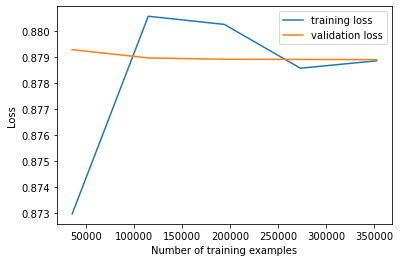

Ridge(alpha=0.001, solver='cholesky') with penalty: 0.001
training loss: 0.8787926685337993
Validation loss: 0.8790161415811133


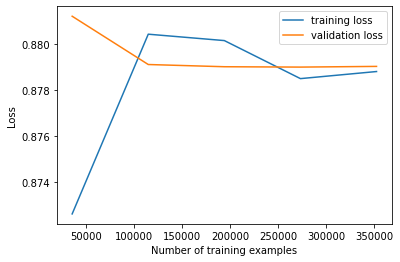

ElasticNet(alpha=0.001) with penalty: 0.001
training loss: 0.8788401953139835
Validation loss: 0.8788988154543035


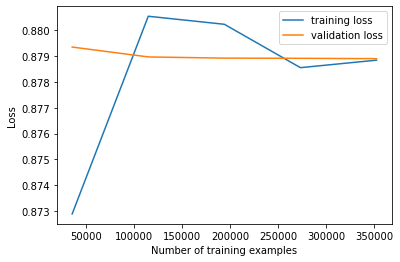

Lasso(alpha=0.005) with penalty: 0.005
training loss: 0.8789695435854099
Validation loss: 0.8790008446110399


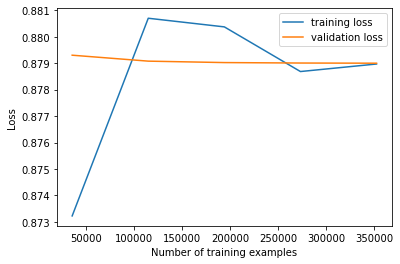

Ridge(alpha=0.005, solver='cholesky') with penalty: 0.005
training loss: 0.8787926686484073
Validation loss: 0.8790157879845046


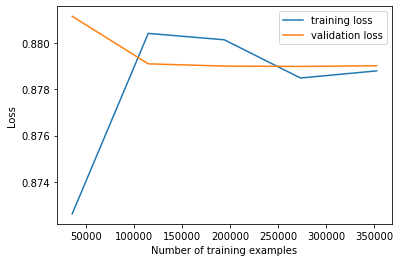

ElasticNet(alpha=0.005) with penalty: 0.005
training loss: 0.8789024737237845
Validation loss: 0.8789410503526124


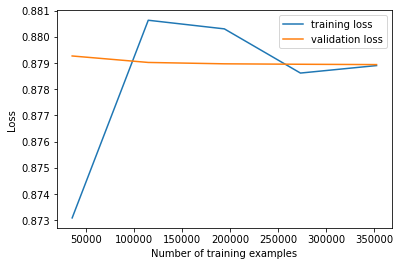

Lasso(alpha=0.01) with penalty: 0.01
training loss: 0.8793480754427478
Validation loss: 0.8793775236075847


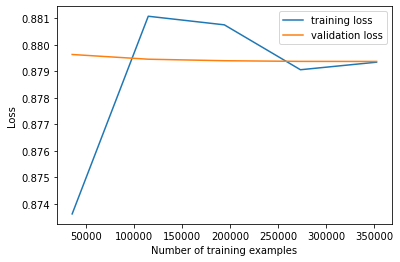

Ridge(alpha=0.01, solver='cholesky') with penalty: 0.01
training loss: 0.8787926689998747
Validation loss: 0.8790153531580195


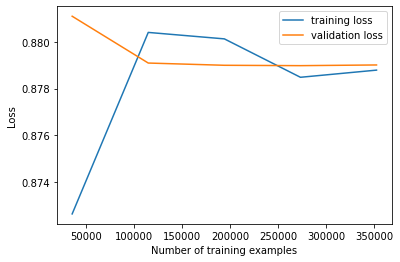

ElasticNet(alpha=0.01) with penalty: 0.01
training loss: 0.8790682894837997
Validation loss: 0.8791004893012405


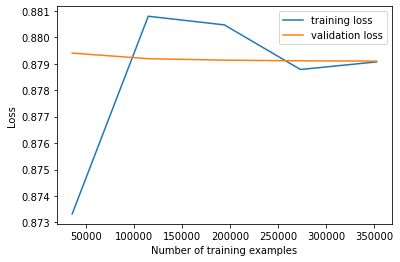

Lasso(alpha=0.05) with penalty: 0.05
training loss: 0.8830282350787668
Validation loss: 0.883055520126012


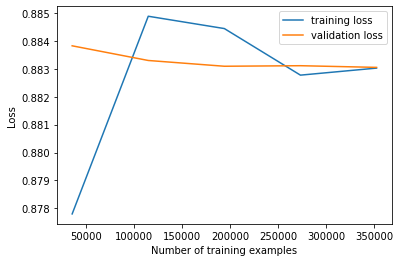

Ridge(alpha=0.05, solver='cholesky') with penalty: 0.05
training loss: 0.8787926790641762
Validation loss: 0.8790121360334582


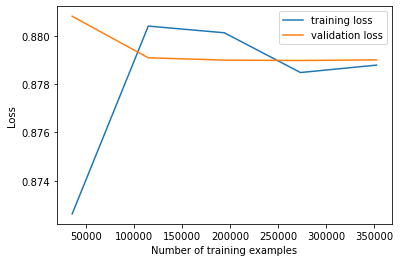

ElasticNet(alpha=0.05) with penalty: 0.05
training loss: 0.881630152094185
Validation loss: 0.8816415229965384


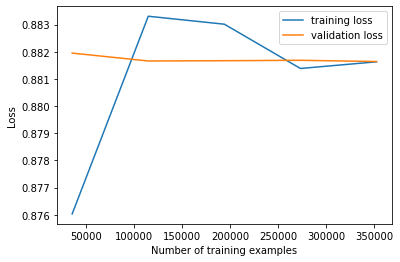

Lasso(alpha=0.1) with penalty: 0.1
training loss: 0.8932600977610895
Validation loss: 0.8932870813944715


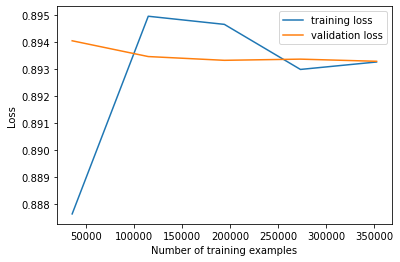

Ridge(alpha=0.1, solver='cholesky') with penalty: 0.1
training loss: 0.8787927055843738
Validation loss: 0.8790086661265968


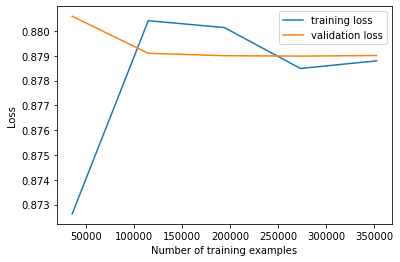

ElasticNet(alpha=0.1) with penalty: 0.1
training loss: 0.884829560275895
Validation loss: 0.8848555607411825


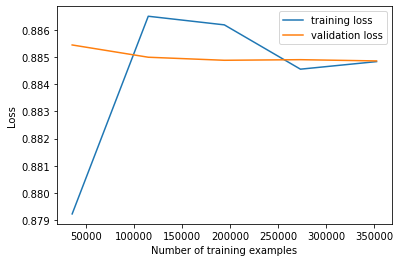

In [116]:
penalty = [0.001,0.005,0.01,0.05,0.1]

for pen in penalty:
    models = []
    models.append(Lasso(alpha = pen))
    models.append(Ridge(alpha=pen, solver="cholesky"))
    models.append(ElasticNet(alpha=pen, l1_ratio=0.5))

    for model in models:
        print(model, "with penalty:", pen)
        cross_validate_score = cross_validate(model, X_poly, y_train, scoring="neg_mean_squared_error", cv=4, return_train_score=True)
        print("training loss:", -cross_validate_score["train_score"].mean())
        print("Validation loss:", -cross_validate_score["test_score"].mean())
        train_sizes, train_loss, val_loss = learning_curve(model, X_poly, y_train, scoring="neg_mean_squared_error", cv=4)

# plot the training and validation loss as a function of training iterations
        plt.plot(train_sizes, -train_loss.mean(axis=1), label="training loss")
        plt.plot(train_sizes, -val_loss.mean(axis=1), label="validation loss")
        plt.xlabel("Number of training examples")
        plt.ylabel("Loss")
        plt.legend()
        plt.show()

## SGD for the polynomial features

# Part G - fix: The same dataset is used to compare all the model. Allowing for easy comparison. 

# Make  predictions  of  the  labels  on  the  test  data,  using  the  trained  model  with  chosen hyperparameters. Summarize performance using the  appropriate  evaluation metric. Discuss  the  results.  Include  thoughts  about  what  further  can  be  explored  to  increase performance

In [122]:
X_train.shape

(469865, 10)

In [123]:
X_test.shape

(117467, 10)

In [124]:
y_train.shape

(469865,)

In [125]:
y_test.shape

(117467,)

## Lasso(alpha=0.1) with penalty: 0.1 seems like the best model for linear regression

In [126]:
model = Lasso(alpha=0.1)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
rmse = mean_squared_error(y_test, y_pred, squared=False)
print("RMSE: ",rmse)

RMSE:  0.9392317468058222


In [246]:
model = Ridge(alpha=0.1)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
rmse = mean_squared_error(y_test, y_pred, squared=False)
print("RMSE: ",rmse)

RMSE:  0.9374896950663288


In [247]:
model = ElasticNet()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
rmse = mean_squared_error(y_test, y_pred, squared=False)
print("RMSE: ",rmse)

RMSE:  1.000164020881976


In [248]:
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
rmse = mean_squared_error(y_test, y_pred, squared=False)
print("RMSE: ",rmse)

RMSE:  0.9374951587128749


## best model for polynomial regression is alpha = 0.01 and learning rate = 0.1

In [128]:
model = Lasso(alpha=0.01)
model.fit(X_poly, y_train)
y_pred = model.predict(X_testpoly)
rmse = mean_squared_error(y_test, y_pred, squared=False)
print("RMSE: ",rmse)

RMSE:  0.9384698037218404


In [250]:
model = Ridge(alpha=0.01)
model.fit(X_poly, y_train)
y_pred = model.predict(X_testpoly)
rmse = mean_squared_error(y_test, y_pred, squared=False)
print("RMSE: ",rmse)

RMSE:  0.9366931597579444


In [251]:
model = ElasticNet()
model.fit(X_poly, y_train)
y_pred = model.predict(X_testpoly)
rmse = mean_squared_error(y_test, y_pred, squared=False)
print("RMSE: ",rmse)

RMSE:  0.9841521679851525


In [252]:
model = LinearRegression()
model.fit(X_poly, y_train)
y_pred = model.predict(X_testpoly)
rmse = mean_squared_error(y_test, y_pred, squared=False)
print("RMSE: ",rmse)

RMSE:  0.9367222284289396


Dispite the huge number of features we started off with, the price factor in the end came to depend on only a number of features. While, this removed the scope for any complicated correlations between the variables, it also showcased how increasing the degree of the polynomial didnt lead to any significant performance boost. A lasso regression model with a penalty rate of 0.1 was the best model found in the evaluation. While, an equivalent lasso model of alpha = 0.01 did perform slightly better on the polynomial dataset, the added compute required made the performance gain slightly irrelevant

It would have been interesting to see if or how the features that were disregarded early in the preprocessing steps would have lead to a performance boost but their negligible correlation with the price output makes this assumption suspect. Further, creating polynomial features of even degree 2 would have been extremely expensive with the 57 original features

In [241]:
# Further improvements -> We can use deep learning to capture more complex relationship in the data. 
# We can also do feature engineering to generate relevant features.
# The best hyperparameters can be found using grid search